## 0. Today...

- Ensemble, Advanced Model
    - Voting
    - XGBoost
    - LGBM
    - Catboost
    - Stacking
    - TabNet
    - 1d-cnn (MoA competition)
- AutoML
    - PyCaret
    - LightAutoML 
- Hyperparameter Tuning
    - Optuna
    - NNI 
- Dashboard
    - Wandb
    - tensorboard
- AutoEDA
    - pandas-profilling

In [1]:
import os
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib as mpl 
import matplotlib.pyplot as plt
import seaborn as sns

- config.yml
- config.json
- config.py

In [2]:
seed = 42
np.random.seed(42)

In [3]:
BASE_DIR = './data' 

train_path = os.path.join(BASE_DIR, 'train.csv')
test_path = os.path.join(BASE_DIR, 'test.csv')
submission_path = os.path.join(BASE_DIR, 'sample_submission.csv')

print(train_path)
print(test_path)

./data\train.csv
./data\test.csv


In [4]:
train = pd.read_csv(train_path) 
test = pd.read_csv(test_path)
sample_submission = pd.read_csv(submission_path)

target = train['credit']
train.drop(['credit'], axis=1, inplace=True)

In [5]:
train.head()

,index,gender,car,reality,child_num,income_total,income_type,edu_type,family_type,house_type,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,work_phone,phone,email,occyp_type,family_size,begin_month
0,0,F,N,N,0,202500.0,Commercial associate,Higher education,Married,Municipal apartment,-13899,-4709,1,0,0,0,NaN,2.0,-6.0
1,1,F,N,Y,1,247500.0,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,-11380,-1540,1,0,0,1,Laborers,3.0,-5.0
2,2,M,Y,Y,0,450000.0,Working,Higher education,Married,House / apartment,-19087,-4434,1,0,1,0,Managers,2.0,-22.0
3,3,F,N,Y,0,202500.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-15088,-2092,1,0,1,0,Sales staff,2.0,-37.0
4,4,F,Y,Y,0,157500.0,State servant,Higher education,Married,House / apartment,-15037,-2105,1,0,0,0,Managers,2.0,-26.0


In [6]:
cat_columns = [c for c, t in zip(train.dtypes.index, train.dtypes) if t=='O'] 
num_columns = [c for c in train.columns if c not in cat_columns]

print(f'Categorical Columns: \n{cat_columns}\n')
print(f'Numeric Columns: \n{num_columns}\n')

Categorical Columns: 
['gender', 'car', 'reality', 'income_type', 'edu_type', 'family_type', 'house_type', 'occyp_type']

Numeric Columns: 
['index', 'child_num', 'income_total', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'FLAG_MOBIL', 'work_phone', 'phone', 'email', 'family_size', 'begin_month']



In [7]:
ohe_cats = []
for cat_col in cat_columns:
    ohe_cats.append(pd.get_dummies(train[cat_col], prefix=cat_col, prefix_sep='-'))

train = train.join(ohe_cats)
train.drop(cat_columns, axis=1, inplace=True)

In [8]:
ohe_cats = []
for cat_col in cat_columns:
    ohe_cats.append(pd.get_dummies(test[cat_col], prefix=cat_col, prefix_sep='-'))

test = test.join(ohe_cats)
test.drop(cat_columns, axis=1, inplace=True)

In [9]:
test = test[train.columns]

## 1. Ensemble

앙상블이란 여러 모델을 조합하거나 이를 활용하여 성능을 높이는 머신러닝 기법입니다.

경진 대회에서는 대부분 이 앙상블을 사용하여 성능을 높이는 편입니다.

앙상블을 위해서는 기본 모델의 성능이 좋아야 하고, 결론적으로는 모든 개별 모델의 성능을 높이긴 해야합니다.

또한 최후 team을 만들 때는 각자 개별 모델에서 좋은 성능을 가진 사용자끼리 합치면 좋습니다.

*일반적으로 과적합된 모델을 앙상블하면 좋다는 의견이 있습니다.*


### 1-1. Voting

- 기본적으로는 투표(voting)와 같습니다. 
    - 모델 A, 모델 B, 모델 C의 결과를 평균내는 것
    - 평균을 내는 방식은 다양함
        - 산술평균 : 일반적인 평균
            - linear regression / xgboost
            - (lr*1 + xgb*2) / 3
            - blending
        - 기하평균 : 모든 내용을 곱하고 1/n
        - 조화평균 : 역수의 산술평균 역수
        - n 제곱 후 평균 
        
    

In [10]:
from sklearn.metrics import log_loss
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold

ohe = OneHotEncoder(sparse=False)
target_ohe = ohe.fit_transform(target.values.reshape(-1, 1))

# model 리스트, 입력(X), 출력(y)
def voting_model_test(model_lst, X, y):
    # A, B, C
    # [[A1, A2, A3]
    # [B1, B2, B3]
    # [C1, C2, C3]]

    valid_scores = [[] for i in range(len(model_lst))]

    # [ABC1, ABC2, ABC3]
    voting_scores = []

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=71)

    # OOF Ensemble (Out-of-Fold)
    # 0, 1, 2, 3, 4, 5, 6, 7, 8, 9

    # tr_idx : [2, 3, 4, 5, 6, 7, 8, 9] va_idx : [0, 1]
    # tr_idx : [0, 1, 4, 5, 6, 7, 8, 9] va_idx : [2, 3]
    # tr_idx : [0, 1, 2, 3, 6, 7, 8, 9] va_idx : [4, 5]
    # tr_idx : [0, 1, 2, 3, 4, 5, 8, 9] va_idx : [6, 7]
    # tr_idx : [0, 1, 2, 3, 4, 5, 6, 7] va_idx : [8, 9]
    for tr_idx, va_idx in skf.split(X, y):
        
        X_train, X_val = X.iloc[tr_idx], X.iloc[va_idx]
        y_train, y_val = y[tr_idx], y[va_idx]
        
        preds = []

        # enumerate
        # 0, model_1
        # 1, model_2
        # 2, mode_3

        for idx, model in enumerate(model_lst):
            model.fit(X_train, y_train)
            pred = model.predict_proba(X_val)
            valid_score = log_loss(ohe.transform(y_val.reshape(-1, 1)), pred)
            valid_scores[idx].append(valid_score)
            preds.append(pred)

        # [N, 3] [N, 3] [N, 3]
        # [model_len, N, 3]
        print('total pred shape : ', np.array(preds).shape)
        pred = np.mean(preds, axis=0)
        # [N, 3]
        print('final pred shape : ', pred.shape)
        
        voting_score = log_loss(ohe.transform(y_val.reshape(-1, 1)), pred)
        print(voting_score)
        voting_scores.append(voting_score)

    return valid_scores, voting_scores

- 0.7 (0.3)
- 0.7 (0.3)
- 1 - 0.3 * 0.3 = 0.91

In [11]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

knn = KNeighborsClassifier(n_neighbors=4)
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
rf1 = RandomForestClassifier()
rf2 = RandomForestClassifier()
rf3 = RandomForestClassifier()

model_list = [rf1, rf2, rf3]
voting_model_test(model_list, train, target.values)

total pred shape :  (3, 5292, 3)
final pred shape :  (5292, 3)
0.7398413607200395
total pred shape :  (3, 5292, 3)
final pred shape :  (5292, 3)
0.7337746992123971
total pred shape :  (3, 5291, 3)
final pred shape :  (5291, 3)
0.7307651071806052
total pred shape :  (3, 5291, 3)
final pred shape :  (5291, 3)
0.7283379379022983
total pred shape :  (3, 5291, 3)
final pred shape :  (5291, 3)
0.7213482541101806


([[0.7959609169343699,
   0.7880397532287161,
   0.789244113753571,
   0.8189945958909383,
   0.7852079138746116],
  [0.8149601057217993,
   0.7488062433147743,
   0.7701113623945892,
   0.785333266910858,
   0.7675947737265112],
  [0.7858916068439306,
   0.7861375844143272,
   0.80061451863883,
   0.7979421692995877,
   0.7628064830326787]],
 [0.7398413607200395,
  0.7337746992123971,
  0.7307651071806052,
  0.7283379379022983,
  0.7213482541101806])

### Tips : model training

In [12]:
# 모델 테스트 및 리턴

def train_model(model_cls, # model class
                X, 
                y, 
                params={'random_state':seed}, # random seed를 포함한 다양한 파라미터
                X_test=None # 테스트 유무
               ):
    
    # model에 파라미터를 dictionary로 주는 방법
    # unpacking (dictionary unpacking)
    # 후에 json으로 hyperparameter 관리 가능
    model = model_cls(**params) 
    
    # train과 valid의 차이로 지나친 오버피팅 방지
    train_scores, valid_scores, test_result = [], [], []
    
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

    for tr_idx, va_idx in skf.split(X, y):
        X_train, X_val = X.iloc[tr_idx], X.iloc[va_idx]
        y_train, y_val = y[tr_idx], y[va_idx]
        model.fit(X_train, y_train)
        
        pred = model.predict_proba(X_train)
        train_score = log_loss(ohe.transform(y_train.reshape(-1, 1)), pred)
        
        pred = model.predict_proba(X_val)
        valid_score = log_loss(ohe.transform(y_val.reshape(-1, 1)), pred)
        
        train_scores.append(train_score)    
        valid_scores.append(valid_score)
        
        if X_test != None:
            pred = model.predict_proba(X_test)
            test_result.append(pred)
        
    # train과 valid의 오버피팅 균형 맞추기
    print('train score mean : ',np.mean(train_scores))
    print('valid score mean : ',np.mean(valid_scores))
    return model, train_scores, valid_scores, test_result

In [13]:
train_model(RandomForestClassifier, train, target.values)

train score mean :  0.1711381966715521
valid score mean :  0.783912079715823


(RandomForestClassifier(random_state=42),
 [0.17259496838174118,
  0.17085062065358678,
  0.17113748092033346,
  0.1701964202096001,
  0.17091149319249901],
 [0.8067777093363531,
  0.779162138232269,
  0.7655281754731111,
  0.7910956201727392,
  0.7769967553646424],
 [])

### 1-2. GBM(Gradient Boosting Model)

부스팅 알고리즘은 여러 개의 약한 학습기를 순차적으로 학습하여 강한 학습기를 만든다.

여기서 대다수는 decision tree를 사용한다. (decision tree를 여러개 사용했다.)

1. 약한 학습기(dt)로 분류를 학습한다.
2. 틀리게 분류한 내용에 가중치를 부가한다.
3. 가중치를 부여한 데이터에 대해 새로운 약한 학습기를 학습을 한다. 이 경우 가중치 덕분에 이전에 틀렸던 내용에 더 집중되어 학습한다.
4. 2-3을 반복한다.
5. 이 과정에서 생긴 약한 학습기를 가중평균 하여 좋은 모델을 만든다. 여기서 가중치는 gradient descent로 학습한다.

### 1-3. GBM 종류와 라이브러리

- GBM(Gradient Boost Machine)
- AdaBoost
- XGBoost(eXtra Gradient Boost)
- LightGBM
- Catboost(Categorial GBM)

In [14]:
# !pip install --upgrade pip
# !pip install lightgbm xgboost catboost

In [15]:
import xgboost as xgb
import lightgbm as lgbm
import catboost as cb

In [16]:
# !pip install xgboost == 1.4.2

In [17]:
print(xgb.__version__)
print(lgbm.__version__)
print(cb.__version__)

1.4.2
3.2.1
0.26.1


### 1-4. XGBoost

- GBM의 단점인 느린 수행 시간 및 과적합 규제 문제 해결
    - 병렬 CPU 환경에서 병렬 학습 가능 -> 속도 개선
    - 뛰어난 예측 설명
    - 과적합 규제 
    - 나무 가지치기  
    - 자체 내장된 교차 검증 : 학습 데이터 세트와 평가 데이터 세트에 대해 교차 검증을 수행하여 최적화된 수행 횟수 가질 수 있음
    - 결손값 자체 처리


- https://sites.google.com/view/lauraepp/parameters

In [18]:
from sklearn.model_selection import train_test_split # single holdout validation

y = target.values
X = train

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

xgbc = xgb.XGBClassifier(nrounds=200)


xgbc.fit(X_train, y_train, 
         eval_set=[(X_train, y_train), (X_val, y_val)],
#          eval_metric="logloss",
        )

pred = xgbc.predict_proba(X_train)
print(log_loss(ohe.transform(y_train.reshape(-1, 1)), pred))

pred = xgbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), pred))


[20:08:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "nrounds" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:08:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-mlogloss:0.97389	validation_1-mlogloss:0.97899
[1]	validation_0-mlogloss:0.90177	validation_1-mlogloss:0.91067
[2]	validation_0-mlogloss:0.85759	validation_1-mlogloss:0.87066
[3]	validation_0-mlogloss:0.82949	validation_1-mlogloss:0.84653
[4]	validation_0-mlogloss:0.80943	validation_1

In [19]:
xgbc.feature_importances_

array([0.01497769, 0.01663365, 0.01947633, 0.02197782, 0.02348446,
       0.        , 0.01824074, 0.02113451, 0.01855915, 0.01882299,
       0.06660278, 0.01969443, 0.        , 0.01662588, 0.        ,
       0.01705899, 0.        , 0.01670107, 0.01659153, 0.01682038,
       0.00180855, 0.01777902, 0.01053365, 0.01720679, 0.02062919,
       0.01629116, 0.01829049, 0.01881552, 0.02165976, 0.01864648,
       0.02068558, 0.01711877, 0.01636884, 0.02000763, 0.02029858,
       0.02013445, 0.030582  , 0.02086328, 0.022832  , 0.01679466,
       0.01255191, 0.01922492, 0.02152403, 0.01493263, 0.01844388,
       0.01520454, 0.01444491, 0.02866018, 0.02044371, 0.0151727 ,
       0.015182  , 0.00806158, 0.0191804 , 0.02286955, 0.01343922,
       0.02991512], dtype=float32)

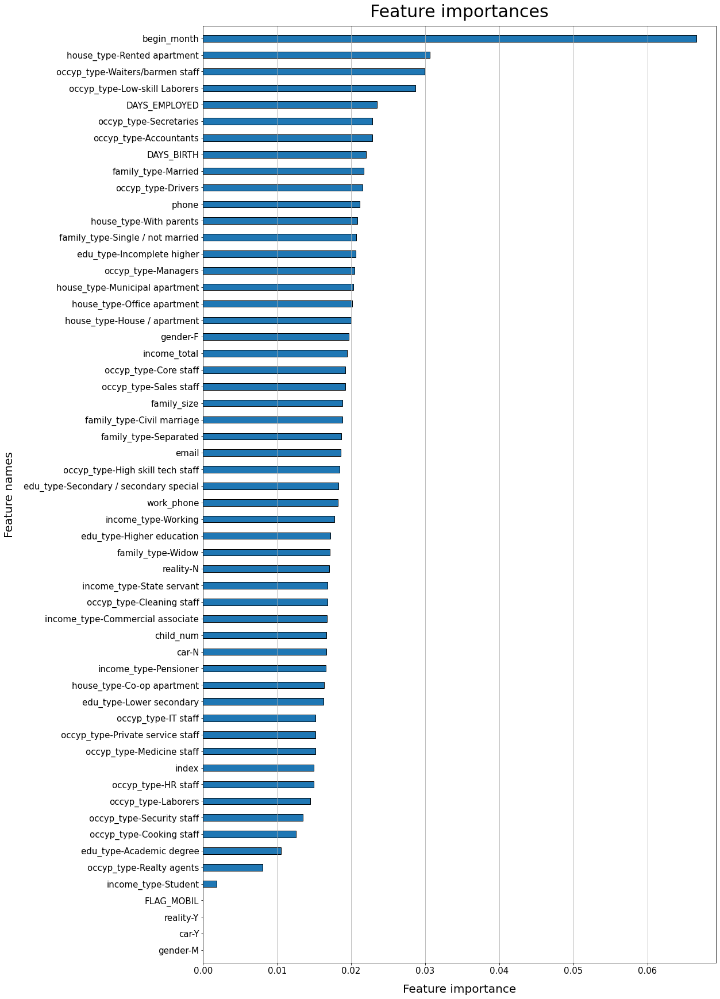

In [20]:
# 새로운 데이터 프레임 
df = pd.DataFrame(columns=["Feature", "Importance"])

# Feature에는 컬럼명 (feature 정보)
df["Feature"] = X.columns

# feature importance
df["Importance"] = xgbc.feature_importances_

# 중요도에 따라서 정렬
df.sort_values("Importance", axis=0, ascending=False, inplace=True)

# 시각화를 위해서 피쳐개수만큼 x축 만들기
x = np.arange(0, len(df["Feature"]))
height = 0.4

# 시각화
fig, ax = plt.subplots(figsize=(16, 30))

# 범주가 많아서 한번에 보기 어려울 때 barh 사용
ax.barh(x, df["Importance"], height=height, edgecolor="black")

# 디양한 텍스트 정보
ax.set_title("Feature importances", fontsize=30, pad=15)
ax.set_ylabel("Feature names", fontsize=20, labelpad=15)
ax.set_xlabel("Feature importance", fontsize=20, labelpad=15)
ax.set_yticks(x)
ax.set_yticklabels(df["Feature"], fontsize=15)
ax.tick_params(axis="x", labelsize=15)
ax.grid(axis="x")
ax.invert_yaxis()

# 시각화 테두리 여백 설정
ax.margins(0.04, 0.01)
plt.show()

In [21]:
train_copy = train.copy()
train_copy['random'] = np.random.rand(len(train))

In [22]:
train_copy['random']

0        0.116898
1        0.939832
2        0.627708
3        0.334906
4        0.139272
           ...   
26452    0.705112
26453    0.503198
26454    0.011309
26455    0.612656
26456    0.919881
Name: random, Length: 26457, dtype: float64

In [23]:
from sklearn.model_selection import train_test_split # single holdout validation



y = target.values
X = train_copy

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

xgbc = xgb.XGBClassifier(nrounds=200)

xgbc.fit(X_train, y_train, 
         eval_set=[(X_train, y_train), (X_val, y_val)],
#          eval_metric="logloss",
        )

pred = xgbc.predict_proba(X_train)
print(log_loss(ohe.transform(y_train.reshape(-1, 1)), pred))

pred = xgbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), pred))


[20:08:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "nrounds" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:08:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[0]	validation_0-mlogloss:0.97411	validation_1-mlogloss:0.97896
[1]	validation_0-mlogloss:0.90164	validation_1-mlogloss:0.91112
[2]	validation_0-mlogloss:0.85763	validation_1-mlogloss:0.87135
[3]	validation_0-mlogloss:0.82897	validation_1-mlogloss:0.84671
[4]	validation_0-mlogloss:0.80977	validation_1

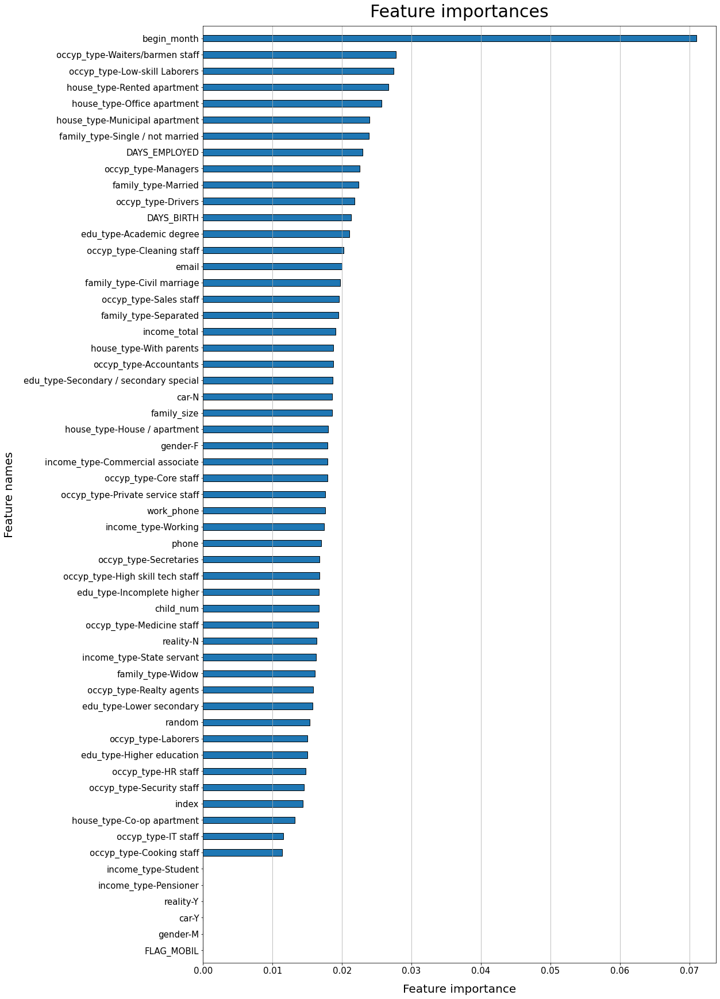

In [24]:
# 새로운 데이터 프레임 
df = pd.DataFrame(columns=["Feature", "Importance"])
df["Feature"] = X.columns
df["Importance"] = xgbc.feature_importances_
df.sort_values("Importance", axis=0, ascending=False, inplace=True)
x = np.arange(0, len(df["Feature"]))
height = 0.4
fig, ax = plt.subplots(figsize=(16, 30))
ax.barh(x, df["Importance"], height=height, edgecolor="black")
ax.set_title("Feature importances", fontsize=30, pad=15)
ax.set_ylabel("Feature names", fontsize=20, labelpad=15)
ax.set_xlabel("Feature importance", fontsize=20, labelpad=15)
ax.set_yticks(x)
ax.set_yticklabels(df["Feature"], fontsize=15)
ax.tick_params(axis="x", labelsize=15)
ax.grid(axis="x")
ax.invert_yaxis()
ax.margins(0.04, 0.01)
plt.show()

Interpretable AI / Explainable AI : 해석가능한 인공지능, 설명가능한 인공지능

- https://github.com/slundberg/shap
- LIME, ELI5, .... 
- https://christophm.github.io/interpretable-ml-book/ 
    - (tootouch님 블로그)

### 1-5. LightGBM

- XGBoost도 느린데 이를 더 빠르게 개선
- 메모리 사용량도 적음
- 범주형 변수 자동 변환

In [25]:
from sklearn.model_selection import train_test_split


y = target.values
X = train

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

lgbc = lgbm.LGBMClassifier()
%time lgbc.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])
%time xgbc.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_val, y_val)])

# pred = lgbc.predict_proba(X_train)
# print(log_loss(ohe.transform(y_train.reshape(-1, 1)), pred))

# lgbm 성능
pred = lgbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), pred))

# xgb 성능
pred = xgbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), pred))


[1]	training's multi_logloss: 0.861771	valid_1's multi_logloss: 0.868191
[2]	training's multi_logloss: 0.847249	valid_1's multi_logloss: 0.856245
[3]	training's multi_logloss: 0.835397	valid_1's multi_logloss: 0.846468
[4]	training's multi_logloss: 0.826008	valid_1's multi_logloss: 0.839171
[5]	training's multi_logloss: 0.81841	valid_1's multi_logloss: 0.833441
[6]	training's multi_logloss: 0.8113	valid_1's multi_logloss: 0.828309
[7]	training's multi_logloss: 0.805557	valid_1's multi_logloss: 0.824249
[8]	training's multi_logloss: 0.800031	valid_1's multi_logloss: 0.820267
[9]	training's multi_logloss: 0.79566	valid_1's multi_logloss: 0.817731
[10]	training's multi_logloss: 0.791303	valid_1's multi_logloss: 0.814754
[11]	training's multi_logloss: 0.787503	valid_1's multi_logloss: 0.812808
[12]	training's multi_logloss: 0.784016	valid_1's multi_logloss: 0.811155
[13]	training's multi_logloss: 0.780474	valid_1's multi_logloss: 0.809129
[14]	training's multi_logloss: 0.777219	valid_1's m

[2]	validation_0-mlogloss:0.85759	validation_1-mlogloss:0.87066
[3]	validation_0-mlogloss:0.82949	validation_1-mlogloss:0.84653
[4]	validation_0-mlogloss:0.80943	validation_1-mlogloss:0.83077
[5]	validation_0-mlogloss:0.79597	validation_1-mlogloss:0.82062
[6]	validation_0-mlogloss:0.78701	validation_1-mlogloss:0.81473
[7]	validation_0-mlogloss:0.78029	validation_1-mlogloss:0.81021
[8]	validation_0-mlogloss:0.77467	validation_1-mlogloss:0.80745
[9]	validation_0-mlogloss:0.76948	validation_1-mlogloss:0.80556
[10]	validation_0-mlogloss:0.76417	validation_1-mlogloss:0.80386
[11]	validation_0-mlogloss:0.75925	validation_1-mlogloss:0.80191
[12]	validation_0-mlogloss:0.75623	validation_1-mlogloss:0.80094
[13]	validation_0-mlogloss:0.75344	validation_1-mlogloss:0.80091
[14]	validation_0-mlogloss:0.74893	validation_1-mlogloss:0.79948
[15]	validation_0-mlogloss:0.74546	validation_1-mlogloss:0.79814
[16]	validation_0-mlogloss:0.74167	validation_1-mlogloss:0.79720
[17]	validation_0-mlogloss:0.7393

In [26]:
voting_model_test([rf, lgbc, xgbc], X, y)

[20:08:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "nrounds" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:08:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
total pred shape :  (3, 5292, 3)
final pred shape :  (5292, 3)
0.723425523517226
[20:08:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:573: 
Parameters: { "nrounds" } might not be used.

  This may not be accurate due to some parameters are only used in langua

([[0.8136689445064215,
   0.7754202986275952,
   0.7628757713006795,
   0.8101332259720897,
   0.7717014956939781],
  [0.7652358938151488,
   0.7651765366035622,
   0.7675558688296537,
   0.7672918304904721,
   0.7591410117326337],
  [0.7567764888258858,
   0.7564136986659441,
   0.7644449300214541,
   0.7616308342364088,
   0.7544372783358798]],
 [0.723425523517226,
  0.7255161758543648,
  0.7295804983864337,
  0.7277301268968698,
  0.7207337557099436])

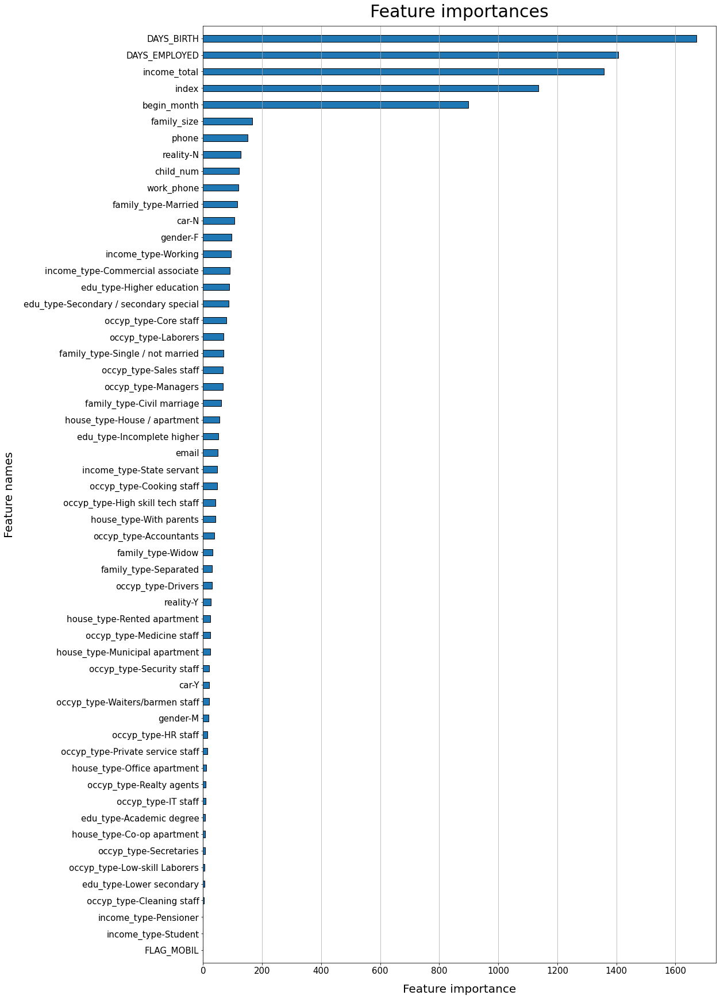

In [27]:
df = pd.DataFrame(columns=["Feature", "Importance"])
df["Feature"] = X.columns
df["Importance"] = lgbc.feature_importances_
df.sort_values("Importance", axis=0, ascending=False, inplace=True)

x = np.arange(0, len(df["Feature"]))
height = 0.4

fig, ax = plt.subplots(figsize=(16, 30))
ax.barh(x, df["Importance"], height=height, edgecolor="black")

ax.set_title("Feature importances", fontsize=30, pad=15)
ax.set_ylabel("Feature names", fontsize=20, labelpad=15)
ax.set_xlabel("Feature importance", fontsize=20, labelpad=15)
ax.set_yticks(x)
ax.set_yticklabels(df["Feature"], fontsize=15)
ax.tick_params(axis="x", labelsize=15)
ax.grid(axis="x")
ax.invert_yaxis()
ax.margins(0.04, 0.01)
plt.show()

### 1-6. Catboost

- 범주형 변수에 대해 개선된 부스팅 모델
- 방법론적으로 다양하게 개선했다.
- 설명 참고 : https://dailyheumsi.tistory.com/136 

In [28]:
cbc = cb.CatBoostClassifier()
cbc.fit(X_train, y_train, 
         eval_set=[(X_train, y_train), (X_val, y_val)],
#          eval_metric="logloss",
        )

pred = cbc.predict_proba(X_train)
print(log_loss(ohe.transform(y_train.reshape(-1, 1)), pred))

pred = cbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), pred))


Learning rate set to 0.114773
0:	learn: 1.0340696	test: 1.0340696	test1: 1.0349148	best: 1.0349148 (0)	total: 175ms	remaining: 2m 55s
1:	learn: 0.9871087	test: 0.9871087	test1: 0.9885624	best: 0.9885624 (1)	total: 188ms	remaining: 1m 33s
2:	learn: 0.9509275	test: 0.9509275	test1: 0.9530339	best: 0.9530339 (2)	total: 213ms	remaining: 1m 10s
3:	learn: 0.9217029	test: 0.9217029	test1: 0.9244376	best: 0.9244376 (3)	total: 220ms	remaining: 54.9s
4:	learn: 0.8988140	test: 0.8988140	test1: 0.9019402	best: 0.9019402 (4)	total: 228ms	remaining: 45.3s
5:	learn: 0.8808892	test: 0.8808892	test1: 0.8843743	best: 0.8843743 (5)	total: 235ms	remaining: 39s
6:	learn: 0.8669747	test: 0.8669747	test1: 0.8707271	best: 0.8707271 (6)	total: 241ms	remaining: 34.2s
7:	learn: 0.8551408	test: 0.8551408	test1: 0.8591519	best: 0.8591519 (7)	total: 249ms	remaining: 30.9s
8:	learn: 0.8454955	test: 0.8454955	test1: 0.8498735	best: 0.8498735 (8)	total: 258ms	remaining: 28.4s
9:	learn: 0.8383980	test: 0.8383980	test1:

93:	learn: 0.7699332	test: 0.7699332	test1: 0.8006049	best: 0.8005510 (90)	total: 971ms	remaining: 9.36s
94:	learn: 0.7695462	test: 0.7695462	test1: 0.8003291	best: 0.8003291 (94)	total: 979ms	remaining: 9.33s
95:	learn: 0.7692203	test: 0.7692203	test1: 0.8004168	best: 0.8003291 (94)	total: 987ms	remaining: 9.29s
96:	learn: 0.7688192	test: 0.7688192	test1: 0.8002872	best: 0.8002872 (96)	total: 995ms	remaining: 9.26s
97:	learn: 0.7685575	test: 0.7685575	test1: 0.8001608	best: 0.8001608 (97)	total: 1s	remaining: 9.22s
98:	learn: 0.7679520	test: 0.7679520	test1: 0.8000090	best: 0.8000090 (98)	total: 1.01s	remaining: 9.19s
99:	learn: 0.7676281	test: 0.7676281	test1: 0.8000631	best: 0.8000090 (98)	total: 1.02s	remaining: 9.16s
100:	learn: 0.7670252	test: 0.7670252	test1: 0.7996787	best: 0.7996787 (100)	total: 1.02s	remaining: 9.13s
101:	learn: 0.7666088	test: 0.7666088	test1: 0.7995399	best: 0.7995399 (101)	total: 1.03s	remaining: 9.1s
102:	learn: 0.7663308	test: 0.7663308	test1: 0.7993676	

181:	learn: 0.7346319	test: 0.7346319	test1: 0.7892282	best: 0.7892282 (181)	total: 1.72s	remaining: 7.74s
182:	learn: 0.7340239	test: 0.7340239	test1: 0.7890448	best: 0.7890448 (182)	total: 1.73s	remaining: 7.73s
183:	learn: 0.7336145	test: 0.7336145	test1: 0.7891163	best: 0.7890448 (182)	total: 1.74s	remaining: 7.71s
184:	learn: 0.7332285	test: 0.7332285	test1: 0.7889801	best: 0.7889801 (184)	total: 1.75s	remaining: 7.69s
185:	learn: 0.7330101	test: 0.7330101	test1: 0.7889366	best: 0.7889366 (185)	total: 1.75s	remaining: 7.67s
186:	learn: 0.7327575	test: 0.7327575	test1: 0.7889512	best: 0.7889366 (185)	total: 1.76s	remaining: 7.66s
187:	learn: 0.7323818	test: 0.7323818	test1: 0.7885964	best: 0.7885964 (187)	total: 1.77s	remaining: 7.64s
188:	learn: 0.7320997	test: 0.7320997	test1: 0.7885484	best: 0.7885484 (188)	total: 1.78s	remaining: 7.63s
189:	learn: 0.7317519	test: 0.7317519	test1: 0.7884966	best: 0.7884966 (189)	total: 1.78s	remaining: 7.61s
190:	learn: 0.7314717	test: 0.7314717

275:	learn: 0.7068412	test: 0.7068412	test1: 0.7833041	best: 0.7833041 (275)	total: 2.46s	remaining: 6.44s
276:	learn: 0.7065295	test: 0.7065295	test1: 0.7831688	best: 0.7831688 (276)	total: 2.46s	remaining: 6.43s
277:	learn: 0.7063286	test: 0.7063286	test1: 0.7832106	best: 0.7831688 (276)	total: 2.47s	remaining: 6.42s
278:	learn: 0.7057904	test: 0.7057904	test1: 0.7830203	best: 0.7830203 (278)	total: 2.48s	remaining: 6.41s
279:	learn: 0.7055002	test: 0.7055002	test1: 0.7829040	best: 0.7829040 (279)	total: 2.49s	remaining: 6.4s
280:	learn: 0.7051912	test: 0.7051912	test1: 0.7828521	best: 0.7828521 (280)	total: 2.5s	remaining: 6.39s
281:	learn: 0.7050013	test: 0.7050013	test1: 0.7828832	best: 0.7828521 (280)	total: 2.5s	remaining: 6.37s
282:	learn: 0.7047761	test: 0.7047761	test1: 0.7828710	best: 0.7828521 (280)	total: 2.51s	remaining: 6.36s
283:	learn: 0.7043975	test: 0.7043975	test1: 0.7828087	best: 0.7828087 (283)	total: 2.52s	remaining: 6.35s
284:	learn: 0.7041544	test: 0.7041544	te

368:	learn: 0.6818474	test: 0.6818474	test1: 0.7799284	best: 0.7798570 (367)	total: 3.24s	remaining: 5.54s
369:	learn: 0.6814541	test: 0.6814541	test1: 0.7797226	best: 0.7797226 (369)	total: 3.25s	remaining: 5.53s
370:	learn: 0.6812154	test: 0.6812154	test1: 0.7795704	best: 0.7795704 (370)	total: 3.25s	remaining: 5.51s
371:	learn: 0.6809362	test: 0.6809362	test1: 0.7796198	best: 0.7795704 (370)	total: 3.26s	remaining: 5.5s
372:	learn: 0.6806111	test: 0.6806111	test1: 0.7796798	best: 0.7795704 (370)	total: 3.27s	remaining: 5.5s
373:	learn: 0.6803363	test: 0.6803363	test1: 0.7795090	best: 0.7795090 (373)	total: 3.28s	remaining: 5.49s
374:	learn: 0.6801362	test: 0.6801362	test1: 0.7795381	best: 0.7795090 (373)	total: 3.28s	remaining: 5.47s
375:	learn: 0.6799643	test: 0.6799643	test1: 0.7794156	best: 0.7794156 (375)	total: 3.29s	remaining: 5.46s
376:	learn: 0.6798132	test: 0.6798132	test1: 0.7795152	best: 0.7794156 (375)	total: 3.3s	remaining: 5.45s
377:	learn: 0.6795341	test: 0.6795341	te

454:	learn: 0.6589437	test: 0.6589437	test1: 0.7763337	best: 0.7763337 (454)	total: 3.98s	remaining: 4.77s
455:	learn: 0.6587355	test: 0.6587355	test1: 0.7762000	best: 0.7762000 (455)	total: 3.99s	remaining: 4.76s
456:	learn: 0.6584456	test: 0.6584456	test1: 0.7760763	best: 0.7760763 (456)	total: 4s	remaining: 4.75s
457:	learn: 0.6581374	test: 0.6581374	test1: 0.7760874	best: 0.7760763 (456)	total: 4.01s	remaining: 4.74s
458:	learn: 0.6577164	test: 0.6577164	test1: 0.7760944	best: 0.7760763 (456)	total: 4.02s	remaining: 4.73s
459:	learn: 0.6570772	test: 0.6570772	test1: 0.7759016	best: 0.7759016 (459)	total: 4.02s	remaining: 4.72s
460:	learn: 0.6568543	test: 0.6568543	test1: 0.7758762	best: 0.7758762 (460)	total: 4.03s	remaining: 4.72s
461:	learn: 0.6566316	test: 0.6566316	test1: 0.7759518	best: 0.7758762 (460)	total: 4.04s	remaining: 4.71s
462:	learn: 0.6563742	test: 0.6563742	test1: 0.7758425	best: 0.7758425 (462)	total: 4.05s	remaining: 4.7s
463:	learn: 0.6562208	test: 0.6562208	tes

539:	learn: 0.6409242	test: 0.6409242	test1: 0.7748479	best: 0.7747646 (536)	total: 4.73s	remaining: 4.03s
540:	learn: 0.6405990	test: 0.6405990	test1: 0.7749852	best: 0.7747646 (536)	total: 4.74s	remaining: 4.02s
541:	learn: 0.6402878	test: 0.6402878	test1: 0.7749460	best: 0.7747646 (536)	total: 4.75s	remaining: 4.01s
542:	learn: 0.6400539	test: 0.6400539	test1: 0.7749957	best: 0.7747646 (536)	total: 4.76s	remaining: 4s
543:	learn: 0.6399574	test: 0.6399574	test1: 0.7750004	best: 0.7747646 (536)	total: 4.76s	remaining: 3.99s
544:	learn: 0.6397854	test: 0.6397854	test1: 0.7749691	best: 0.7747646 (536)	total: 4.77s	remaining: 3.98s
545:	learn: 0.6395657	test: 0.6395657	test1: 0.7747512	best: 0.7747512 (545)	total: 4.8s	remaining: 3.99s
546:	learn: 0.6393275	test: 0.6393275	test1: 0.7747340	best: 0.7747340 (546)	total: 4.81s	remaining: 3.98s
547:	learn: 0.6389607	test: 0.6389607	test1: 0.7747180	best: 0.7747180 (547)	total: 4.82s	remaining: 3.97s
548:	learn: 0.6386861	test: 0.6386861	tes

618:	learn: 0.6241499	test: 0.6241499	test1: 0.7733956	best: 0.7732333 (593)	total: 5.47s	remaining: 3.37s
619:	learn: 0.6240016	test: 0.6240016	test1: 0.7732889	best: 0.7732333 (593)	total: 5.48s	remaining: 3.36s
620:	learn: 0.6238165	test: 0.6238165	test1: 0.7731103	best: 0.7731103 (620)	total: 5.49s	remaining: 3.35s
621:	learn: 0.6235813	test: 0.6235813	test1: 0.7730840	best: 0.7730840 (621)	total: 5.5s	remaining: 3.34s
622:	learn: 0.6233565	test: 0.6233565	test1: 0.7729718	best: 0.7729718 (622)	total: 5.52s	remaining: 3.34s
623:	learn: 0.6231164	test: 0.6231164	test1: 0.7729131	best: 0.7729131 (623)	total: 5.53s	remaining: 3.33s
624:	learn: 0.6228879	test: 0.6228879	test1: 0.7729926	best: 0.7729131 (623)	total: 5.54s	remaining: 3.32s
625:	learn: 0.6226627	test: 0.6226627	test1: 0.7728367	best: 0.7728367 (625)	total: 5.55s	remaining: 3.31s
626:	learn: 0.6223800	test: 0.6223800	test1: 0.7726262	best: 0.7726262 (626)	total: 5.56s	remaining: 3.31s
627:	learn: 0.6221097	test: 0.6221097	

701:	learn: 0.6071420	test: 0.6071420	test1: 0.7715648	best: 0.7715281 (699)	total: 6.26s	remaining: 2.65s
702:	learn: 0.6068526	test: 0.6068526	test1: 0.7714664	best: 0.7714664 (702)	total: 6.26s	remaining: 2.65s
703:	learn: 0.6065649	test: 0.6065649	test1: 0.7714445	best: 0.7714445 (703)	total: 6.27s	remaining: 2.64s
704:	learn: 0.6063285	test: 0.6063285	test1: 0.7714801	best: 0.7714445 (703)	total: 6.28s	remaining: 2.63s
705:	learn: 0.6060651	test: 0.6060651	test1: 0.7715254	best: 0.7714445 (703)	total: 6.29s	remaining: 2.62s
706:	learn: 0.6058569	test: 0.6058569	test1: 0.7714858	best: 0.7714445 (703)	total: 6.3s	remaining: 2.61s
707:	learn: 0.6057242	test: 0.6057242	test1: 0.7714849	best: 0.7714445 (703)	total: 6.31s	remaining: 2.6s
708:	learn: 0.6055431	test: 0.6055431	test1: 0.7714712	best: 0.7714445 (703)	total: 6.32s	remaining: 2.6s
709:	learn: 0.6053086	test: 0.6053086	test1: 0.7713071	best: 0.7713071 (709)	total: 6.33s	remaining: 2.59s
710:	learn: 0.6050692	test: 0.6050692	te

780:	learn: 0.5928509	test: 0.5928509	test1: 0.7706202	best: 0.7700117 (759)	total: 7.01s	remaining: 1.97s
781:	learn: 0.5926567	test: 0.5926567	test1: 0.7705341	best: 0.7700117 (759)	total: 7.02s	remaining: 1.96s
782:	learn: 0.5924597	test: 0.5924597	test1: 0.7704801	best: 0.7700117 (759)	total: 7.03s	remaining: 1.95s
783:	learn: 0.5923304	test: 0.5923304	test1: 0.7705690	best: 0.7700117 (759)	total: 7.04s	remaining: 1.94s
784:	learn: 0.5921388	test: 0.5921388	test1: 0.7705929	best: 0.7700117 (759)	total: 7.05s	remaining: 1.93s
785:	learn: 0.5918369	test: 0.5918369	test1: 0.7705803	best: 0.7700117 (759)	total: 7.06s	remaining: 1.92s
786:	learn: 0.5916830	test: 0.5916830	test1: 0.7705779	best: 0.7700117 (759)	total: 7.07s	remaining: 1.91s
787:	learn: 0.5915051	test: 0.5915051	test1: 0.7706368	best: 0.7700117 (759)	total: 7.08s	remaining: 1.91s
788:	learn: 0.5913707	test: 0.5913707	test1: 0.7706204	best: 0.7700117 (759)	total: 7.09s	remaining: 1.9s
789:	learn: 0.5911681	test: 0.5911681	

872:	learn: 0.5756927	test: 0.5756927	test1: 0.7707114	best: 0.7698051 (827)	total: 7.96s	remaining: 1.16s
873:	learn: 0.5755826	test: 0.5755826	test1: 0.7706410	best: 0.7698051 (827)	total: 7.97s	remaining: 1.15s
874:	learn: 0.5754758	test: 0.5754758	test1: 0.7706474	best: 0.7698051 (827)	total: 7.98s	remaining: 1.14s
875:	learn: 0.5753294	test: 0.5753294	test1: 0.7706279	best: 0.7698051 (827)	total: 7.99s	remaining: 1.13s
876:	learn: 0.5750913	test: 0.5750913	test1: 0.7705051	best: 0.7698051 (827)	total: 8s	remaining: 1.12s
877:	learn: 0.5749743	test: 0.5749743	test1: 0.7704349	best: 0.7698051 (827)	total: 8.01s	remaining: 1.11s
878:	learn: 0.5748137	test: 0.5748137	test1: 0.7704611	best: 0.7698051 (827)	total: 8.02s	remaining: 1.1s
879:	learn: 0.5746366	test: 0.5746366	test1: 0.7704049	best: 0.7698051 (827)	total: 8.03s	remaining: 1.09s
880:	learn: 0.5745170	test: 0.5745170	test1: 0.7703647	best: 0.7698051 (827)	total: 8.04s	remaining: 1.08s
881:	learn: 0.5743801	test: 0.5743801	tes

950:	learn: 0.5630959	test: 0.5630959	test1: 0.7698195	best: 0.7697927 (948)	total: 8.77s	remaining: 452ms
951:	learn: 0.5628982	test: 0.5628982	test1: 0.7698285	best: 0.7697927 (948)	total: 8.78s	remaining: 443ms
952:	learn: 0.5625418	test: 0.5625418	test1: 0.7696195	best: 0.7696195 (952)	total: 8.79s	remaining: 434ms
953:	learn: 0.5622943	test: 0.5622943	test1: 0.7694331	best: 0.7694331 (953)	total: 8.8s	remaining: 425ms
954:	learn: 0.5621139	test: 0.5621139	test1: 0.7694750	best: 0.7694331 (953)	total: 8.81s	remaining: 415ms
955:	learn: 0.5619560	test: 0.5619560	test1: 0.7694326	best: 0.7694326 (955)	total: 8.82s	remaining: 406ms
956:	learn: 0.5617971	test: 0.5617971	test1: 0.7693609	best: 0.7693609 (956)	total: 8.83s	remaining: 397ms
957:	learn: 0.5616033	test: 0.5616033	test1: 0.7694909	best: 0.7693609 (956)	total: 8.84s	remaining: 388ms
958:	learn: 0.5614306	test: 0.5614306	test1: 0.7694620	best: 0.7693609 (956)	total: 8.85s	remaining: 378ms
959:	learn: 0.5612632	test: 0.5612632	

In [29]:
result = voting_model_test([xgb.XGBClassifier(), lgbm.LGBMClassifier(), cb.CatBoostClassifier()], 
                           train, 
                           target.values)

[20:09:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.092455
0:	learn: 1.0462293	total: 9.39ms	remaining: 9.38s
1:	learn: 1.0059342	total: 18.8ms	remaining: 9.4s
2:	learn: 0.9731892	total: 28.4ms	remaining: 9.44s
3:	learn: 0.9455488	total: 37.8ms	remaining: 9.4s
4:	learn: 0.9229254	total: 45.5ms	remaining: 9.05s
5:	learn: 0.9044382	total: 56ms	remaining: 9.27s
6:	learn: 0.8895399	total: 61.9ms	remaining: 8.78s
7:	learn: 0.8763881	total: 70.6ms	remaining: 8.75s
8:	learn: 0.8653009	total: 80.3ms	remaining: 8.84s
9:	learn: 0.8561132	total: 88.7ms	remaining: 8.79s
10:	learn: 0.8483758	total: 96.8ms	remaining: 8.7s
11:	learn: 0.8422805	total: 102ms	remaining: 8.39s
12:	learn: 0.8365577	total: 110ms	remaining: 8.34s


166:	learn: 0.7544798	total: 1.53s	remaining: 7.62s
167:	learn: 0.7542142	total: 1.53s	remaining: 7.61s
168:	learn: 0.7540888	total: 1.54s	remaining: 7.58s
169:	learn: 0.7538606	total: 1.55s	remaining: 7.57s
170:	learn: 0.7534386	total: 1.56s	remaining: 7.58s
171:	learn: 0.7531630	total: 1.57s	remaining: 7.56s
172:	learn: 0.7528108	total: 1.58s	remaining: 7.55s
173:	learn: 0.7525140	total: 1.59s	remaining: 7.53s
174:	learn: 0.7521781	total: 1.59s	remaining: 7.51s
175:	learn: 0.7518840	total: 1.6s	remaining: 7.49s
176:	learn: 0.7516491	total: 1.61s	remaining: 7.48s
177:	learn: 0.7512119	total: 1.61s	remaining: 7.46s
178:	learn: 0.7508689	total: 1.62s	remaining: 7.44s
179:	learn: 0.7507437	total: 1.63s	remaining: 7.43s
180:	learn: 0.7502440	total: 1.64s	remaining: 7.41s
181:	learn: 0.7498832	total: 1.65s	remaining: 7.4s
182:	learn: 0.7497213	total: 1.65s	remaining: 7.38s
183:	learn: 0.7490314	total: 1.66s	remaining: 7.37s
184:	learn: 0.7488016	total: 1.67s	remaining: 7.36s
185:	learn: 0.

328:	learn: 0.7115856	total: 2.85s	remaining: 5.82s
329:	learn: 0.7113873	total: 2.86s	remaining: 5.81s
330:	learn: 0.7109775	total: 2.87s	remaining: 5.8s
331:	learn: 0.7105444	total: 2.88s	remaining: 5.79s
332:	learn: 0.7104017	total: 2.89s	remaining: 5.79s
333:	learn: 0.7100486	total: 2.9s	remaining: 5.78s
334:	learn: 0.7098786	total: 2.9s	remaining: 5.77s
335:	learn: 0.7096638	total: 2.91s	remaining: 5.76s
336:	learn: 0.7094327	total: 2.92s	remaining: 5.75s
337:	learn: 0.7089729	total: 2.93s	remaining: 5.74s
338:	learn: 0.7087011	total: 2.94s	remaining: 5.74s
339:	learn: 0.7084405	total: 2.95s	remaining: 5.74s
340:	learn: 0.7081257	total: 2.97s	remaining: 5.74s
341:	learn: 0.7079090	total: 2.98s	remaining: 5.73s
342:	learn: 0.7075882	total: 2.99s	remaining: 5.73s
343:	learn: 0.7072952	total: 3s	remaining: 5.72s
344:	learn: 0.7071257	total: 3.01s	remaining: 5.72s
345:	learn: 0.7069239	total: 3.02s	remaining: 5.72s
346:	learn: 0.7066068	total: 3.04s	remaining: 5.72s
347:	learn: 0.7063

503:	learn: 0.6723405	total: 4.58s	remaining: 4.51s
504:	learn: 0.6721382	total: 4.59s	remaining: 4.5s
505:	learn: 0.6718856	total: 4.59s	remaining: 4.49s
506:	learn: 0.6716032	total: 4.6s	remaining: 4.48s
507:	learn: 0.6713521	total: 4.61s	remaining: 4.46s
508:	learn: 0.6711723	total: 4.62s	remaining: 4.46s
509:	learn: 0.6709319	total: 4.63s	remaining: 4.45s
510:	learn: 0.6707845	total: 4.64s	remaining: 4.44s
511:	learn: 0.6706034	total: 4.65s	remaining: 4.43s
512:	learn: 0.6702901	total: 4.66s	remaining: 4.42s
513:	learn: 0.6701022	total: 4.66s	remaining: 4.41s
514:	learn: 0.6699153	total: 4.67s	remaining: 4.4s
515:	learn: 0.6697250	total: 4.68s	remaining: 4.39s
516:	learn: 0.6696103	total: 4.69s	remaining: 4.38s
517:	learn: 0.6694093	total: 4.69s	remaining: 4.37s
518:	learn: 0.6691753	total: 4.7s	remaining: 4.36s
519:	learn: 0.6690329	total: 4.71s	remaining: 4.35s
520:	learn: 0.6688019	total: 4.71s	remaining: 4.33s
521:	learn: 0.6686245	total: 4.72s	remaining: 4.32s
522:	learn: 0.66

670:	learn: 0.6408877	total: 6.07s	remaining: 2.98s
671:	learn: 0.6406515	total: 6.08s	remaining: 2.97s
672:	learn: 0.6405102	total: 6.09s	remaining: 2.96s
673:	learn: 0.6403178	total: 6.1s	remaining: 2.95s
674:	learn: 0.6402823	total: 6.12s	remaining: 2.95s
675:	learn: 0.6400094	total: 6.13s	remaining: 2.94s
676:	learn: 0.6398032	total: 6.14s	remaining: 2.93s
677:	learn: 0.6396232	total: 6.14s	remaining: 2.92s
678:	learn: 0.6395065	total: 6.15s	remaining: 2.91s
679:	learn: 0.6391310	total: 6.16s	remaining: 2.9s
680:	learn: 0.6387865	total: 6.17s	remaining: 2.89s
681:	learn: 0.6386942	total: 6.17s	remaining: 2.88s
682:	learn: 0.6385091	total: 6.18s	remaining: 2.87s
683:	learn: 0.6383297	total: 6.19s	remaining: 2.86s
684:	learn: 0.6382588	total: 6.19s	remaining: 2.85s
685:	learn: 0.6380823	total: 6.2s	remaining: 2.84s
686:	learn: 0.6377833	total: 6.21s	remaining: 2.83s
687:	learn: 0.6375603	total: 6.21s	remaining: 2.82s
688:	learn: 0.6374255	total: 6.22s	remaining: 2.81s
689:	learn: 0.6

849:	learn: 0.6108519	total: 7.56s	remaining: 1.33s
850:	learn: 0.6107287	total: 7.56s	remaining: 1.32s
851:	learn: 0.6106336	total: 7.57s	remaining: 1.31s
852:	learn: 0.6104822	total: 7.58s	remaining: 1.31s
853:	learn: 0.6103538	total: 7.59s	remaining: 1.3s
854:	learn: 0.6102040	total: 7.59s	remaining: 1.29s
855:	learn: 0.6101233	total: 7.6s	remaining: 1.28s
856:	learn: 0.6099593	total: 7.61s	remaining: 1.27s
857:	learn: 0.6098309	total: 7.61s	remaining: 1.26s
858:	learn: 0.6096156	total: 7.62s	remaining: 1.25s
859:	learn: 0.6095073	total: 7.63s	remaining: 1.24s
860:	learn: 0.6093895	total: 7.63s	remaining: 1.23s
861:	learn: 0.6092038	total: 7.64s	remaining: 1.22s
862:	learn: 0.6090410	total: 7.65s	remaining: 1.21s
863:	learn: 0.6088578	total: 7.66s	remaining: 1.21s
864:	learn: 0.6087227	total: 7.66s	remaining: 1.2s
865:	learn: 0.6084992	total: 7.67s	remaining: 1.19s
866:	learn: 0.6083679	total: 7.68s	remaining: 1.18s
867:	learn: 0.6082714	total: 7.68s	remaining: 1.17s
868:	learn: 0.6

Learning rate set to 0.092455
0:	learn: 1.0463210	total: 9.09ms	remaining: 9.08s
1:	learn: 1.0055835	total: 18.2ms	remaining: 9.07s
2:	learn: 0.9727642	total: 27.1ms	remaining: 9.02s
3:	learn: 0.9454340	total: 36ms	remaining: 8.97s
4:	learn: 0.9230848	total: 43.6ms	remaining: 8.67s
5:	learn: 0.9046506	total: 51ms	remaining: 8.44s
6:	learn: 0.8896442	total: 56.6ms	remaining: 8.03s
7:	learn: 0.8766747	total: 63.7ms	remaining: 7.9s
8:	learn: 0.8655804	total: 71ms	remaining: 7.82s
9:	learn: 0.8570408	total: 77.9ms	remaining: 7.71s
10:	learn: 0.8492927	total: 84.7ms	remaining: 7.61s
11:	learn: 0.8430891	total: 88.9ms	remaining: 7.32s
12:	learn: 0.8374676	total: 95.8ms	remaining: 7.28s
13:	learn: 0.8326989	total: 103ms	remaining: 7.24s
14:	learn: 0.8288850	total: 108ms	remaining: 7.1s
15:	learn: 0.8255202	total: 115ms	remaining: 7.07s
16:	learn: 0.8224939	total: 139ms	remaining: 8.05s
17:	learn: 0.8201894	total: 147ms	remaining: 8.04s
18:	learn: 0.8181292	total: 156ms	remaining: 8.04s
19:	le

174:	learn: 0.7494766	total: 1.53s	remaining: 7.21s
175:	learn: 0.7493321	total: 1.54s	remaining: 7.2s
176:	learn: 0.7487931	total: 1.54s	remaining: 7.18s
177:	learn: 0.7484894	total: 1.55s	remaining: 7.17s
178:	learn: 0.7481562	total: 1.56s	remaining: 7.15s
179:	learn: 0.7478944	total: 1.57s	remaining: 7.14s
180:	learn: 0.7475721	total: 1.57s	remaining: 7.12s
181:	learn: 0.7471767	total: 1.58s	remaining: 7.11s
182:	learn: 0.7469618	total: 1.59s	remaining: 7.09s
183:	learn: 0.7466029	total: 1.6s	remaining: 7.08s
184:	learn: 0.7463356	total: 1.6s	remaining: 7.06s
185:	learn: 0.7461043	total: 1.61s	remaining: 7.05s
186:	learn: 0.7458656	total: 1.62s	remaining: 7.03s
187:	learn: 0.7455254	total: 1.62s	remaining: 7.02s
188:	learn: 0.7453699	total: 1.63s	remaining: 7s
189:	learn: 0.7452049	total: 1.64s	remaining: 6.99s
190:	learn: 0.7449437	total: 1.65s	remaining: 6.97s
191:	learn: 0.7447277	total: 1.65s	remaining: 6.96s
192:	learn: 0.7444059	total: 1.66s	remaining: 6.94s
193:	learn: 0.7438

348:	learn: 0.7055366	total: 3.02s	remaining: 5.64s
349:	learn: 0.7053182	total: 3.03s	remaining: 5.63s
350:	learn: 0.7051405	total: 3.04s	remaining: 5.62s
351:	learn: 0.7049689	total: 3.05s	remaining: 5.61s
352:	learn: 0.7047202	total: 3.05s	remaining: 5.6s
353:	learn: 0.7045085	total: 3.06s	remaining: 5.58s
354:	learn: 0.7043547	total: 3.07s	remaining: 5.57s
355:	learn: 0.7041892	total: 3.08s	remaining: 5.56s
356:	learn: 0.7039846	total: 3.1s	remaining: 5.58s
357:	learn: 0.7038378	total: 3.11s	remaining: 5.57s
358:	learn: 0.7037092	total: 3.11s	remaining: 5.56s
359:	learn: 0.7035097	total: 3.12s	remaining: 5.55s
360:	learn: 0.7033257	total: 3.13s	remaining: 5.54s
361:	learn: 0.7031856	total: 3.13s	remaining: 5.53s
362:	learn: 0.7030213	total: 3.14s	remaining: 5.51s
363:	learn: 0.7025934	total: 3.15s	remaining: 5.5s
364:	learn: 0.7023037	total: 3.16s	remaining: 5.49s
365:	learn: 0.7020498	total: 3.16s	remaining: 5.48s
366:	learn: 0.7017587	total: 3.17s	remaining: 5.47s
367:	learn: 0.7

513:	learn: 0.6689613	total: 4.31s	remaining: 4.07s
514:	learn: 0.6687749	total: 4.32s	remaining: 4.06s
515:	learn: 0.6685238	total: 4.32s	remaining: 4.05s
516:	learn: 0.6683559	total: 4.33s	remaining: 4.04s
517:	learn: 0.6679839	total: 4.34s	remaining: 4.04s
518:	learn: 0.6676819	total: 4.34s	remaining: 4.03s
519:	learn: 0.6675625	total: 4.35s	remaining: 4.02s
520:	learn: 0.6671776	total: 4.36s	remaining: 4.01s
521:	learn: 0.6667453	total: 4.37s	remaining: 4s
522:	learn: 0.6666544	total: 4.37s	remaining: 3.99s
523:	learn: 0.6664228	total: 4.38s	remaining: 3.98s
524:	learn: 0.6662137	total: 4.39s	remaining: 3.97s
525:	learn: 0.6660827	total: 4.39s	remaining: 3.96s
526:	learn: 0.6659262	total: 4.41s	remaining: 3.96s
527:	learn: 0.6657231	total: 4.42s	remaining: 3.95s
528:	learn: 0.6654591	total: 4.42s	remaining: 3.94s
529:	learn: 0.6653538	total: 4.43s	remaining: 3.93s
530:	learn: 0.6651108	total: 4.44s	remaining: 3.92s
531:	learn: 0.6649304	total: 4.45s	remaining: 3.91s
532:	learn: 0.6

680:	learn: 0.6385491	total: 5.6s	remaining: 2.62s
681:	learn: 0.6382501	total: 5.61s	remaining: 2.62s
682:	learn: 0.6381407	total: 5.62s	remaining: 2.61s
683:	learn: 0.6379873	total: 5.62s	remaining: 2.6s
684:	learn: 0.6378402	total: 5.65s	remaining: 2.6s
685:	learn: 0.6376910	total: 5.66s	remaining: 2.59s
686:	learn: 0.6375681	total: 5.66s	remaining: 2.58s
687:	learn: 0.6374280	total: 5.67s	remaining: 2.57s
688:	learn: 0.6373479	total: 5.68s	remaining: 2.56s
689:	learn: 0.6372028	total: 5.68s	remaining: 2.55s
690:	learn: 0.6370354	total: 5.69s	remaining: 2.54s
691:	learn: 0.6369007	total: 5.7s	remaining: 2.54s
692:	learn: 0.6367473	total: 5.72s	remaining: 2.54s
693:	learn: 0.6364917	total: 5.73s	remaining: 2.53s
694:	learn: 0.6361138	total: 5.74s	remaining: 2.52s
695:	learn: 0.6359289	total: 5.75s	remaining: 2.51s
696:	learn: 0.6358074	total: 5.76s	remaining: 2.5s
697:	learn: 0.6356075	total: 5.76s	remaining: 2.49s
698:	learn: 0.6354616	total: 5.77s	remaining: 2.48s
699:	learn: 0.635

839:	learn: 0.6124613	total: 6.89s	remaining: 1.31s
840:	learn: 0.6123495	total: 6.91s	remaining: 1.3s
841:	learn: 0.6122184	total: 6.92s	remaining: 1.3s
842:	learn: 0.6120771	total: 6.93s	remaining: 1.29s
843:	learn: 0.6119651	total: 6.94s	remaining: 1.28s
844:	learn: 0.6118101	total: 6.95s	remaining: 1.27s
845:	learn: 0.6115518	total: 6.95s	remaining: 1.26s
846:	learn: 0.6114133	total: 6.96s	remaining: 1.26s
847:	learn: 0.6112025	total: 6.97s	remaining: 1.25s
848:	learn: 0.6110624	total: 6.98s	remaining: 1.24s
849:	learn: 0.6109687	total: 6.99s	remaining: 1.23s
850:	learn: 0.6108315	total: 7s	remaining: 1.23s
851:	learn: 0.6106158	total: 7s	remaining: 1.22s
852:	learn: 0.6103984	total: 7.01s	remaining: 1.21s
853:	learn: 0.6102139	total: 7.02s	remaining: 1.2s
854:	learn: 0.6099646	total: 7.03s	remaining: 1.19s
855:	learn: 0.6096032	total: 7.04s	remaining: 1.18s
856:	learn: 0.6094434	total: 7.04s	remaining: 1.18s
857:	learn: 0.6092991	total: 7.05s	remaining: 1.17s
858:	learn: 0.6092383

[20:09:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.092455
0:	learn: 1.0462148	total: 9.25ms	remaining: 9.24s
1:	learn: 1.0055579	total: 18.7ms	remaining: 9.32s
2:	learn: 0.9728092	total: 27.8ms	remaining: 9.23s
3:	learn: 0.9452669	total: 35.4ms	remaining: 8.82s
4:	learn: 0.9227243	total: 42.1ms	remaining: 8.38s
5:	learn: 0.9042552	total: 49.6ms	remaining: 8.21s
6:	learn: 0.8892674	total: 55.3ms	remaining: 7.84s
7:	learn: 0.8761381	total: 62.3ms	remaining: 7.72s
8:	learn: 0.8649451	total: 69.7ms	remaining: 7.67s
9:	learn: 0.8563434	total: 76.7ms	remaining: 7.59s
10:	learn: 0.8484274	total: 83.7ms	remaining: 7.53s
11:	learn: 0.8422575	total: 88.3ms	remaining: 7.27s
12:	learn: 0.8365108	total: 95.1ms	remaining:

168:	learn: 0.7514113	total: 1.29s	remaining: 6.33s
169:	learn: 0.7508827	total: 1.29s	remaining: 6.32s
170:	learn: 0.7507244	total: 1.3s	remaining: 6.31s
171:	learn: 0.7504230	total: 1.31s	remaining: 6.3s
172:	learn: 0.7502327	total: 1.32s	remaining: 6.29s
173:	learn: 0.7500088	total: 1.32s	remaining: 6.28s
174:	learn: 0.7497320	total: 1.33s	remaining: 6.27s
175:	learn: 0.7494692	total: 1.34s	remaining: 6.26s
176:	learn: 0.7491382	total: 1.34s	remaining: 6.25s
177:	learn: 0.7485700	total: 1.35s	remaining: 6.25s
178:	learn: 0.7483374	total: 1.36s	remaining: 6.24s
179:	learn: 0.7481963	total: 1.37s	remaining: 6.23s
180:	learn: 0.7479419	total: 1.37s	remaining: 6.22s
181:	learn: 0.7476176	total: 1.38s	remaining: 6.21s
182:	learn: 0.7472777	total: 1.39s	remaining: 6.21s
183:	learn: 0.7470889	total: 1.4s	remaining: 6.2s
184:	learn: 0.7468692	total: 1.4s	remaining: 6.19s
185:	learn: 0.7467114	total: 1.42s	remaining: 6.23s
186:	learn: 0.7464724	total: 1.43s	remaining: 6.22s
187:	learn: 0.746

343:	learn: 0.7056810	total: 2.57s	remaining: 4.9s
344:	learn: 0.7055610	total: 2.58s	remaining: 4.89s
345:	learn: 0.7054255	total: 2.58s	remaining: 4.88s
346:	learn: 0.7052643	total: 2.59s	remaining: 4.87s
347:	learn: 0.7050721	total: 2.6s	remaining: 4.86s
348:	learn: 0.7048177	total: 2.6s	remaining: 4.86s
349:	learn: 0.7046113	total: 2.61s	remaining: 4.85s
350:	learn: 0.7043684	total: 2.62s	remaining: 4.84s
351:	learn: 0.7041719	total: 2.63s	remaining: 4.83s
352:	learn: 0.7038844	total: 2.63s	remaining: 4.82s
353:	learn: 0.7036244	total: 2.64s	remaining: 4.82s
354:	learn: 0.7033773	total: 2.65s	remaining: 4.81s
355:	learn: 0.7030566	total: 2.65s	remaining: 4.8s
356:	learn: 0.7028602	total: 2.66s	remaining: 4.79s
357:	learn: 0.7025360	total: 2.67s	remaining: 4.79s
358:	learn: 0.7023216	total: 2.67s	remaining: 4.78s
359:	learn: 0.7021265	total: 2.68s	remaining: 4.77s
360:	learn: 0.7019293	total: 2.69s	remaining: 4.76s
361:	learn: 0.7018020	total: 2.7s	remaining: 4.75s
362:	learn: 0.701

513:	learn: 0.6707636	total: 3.84s	remaining: 3.63s
514:	learn: 0.6704575	total: 3.85s	remaining: 3.63s
515:	learn: 0.6701865	total: 3.86s	remaining: 3.62s
516:	learn: 0.6700563	total: 3.87s	remaining: 3.61s
517:	learn: 0.6699279	total: 3.87s	remaining: 3.6s
518:	learn: 0.6696925	total: 3.88s	remaining: 3.6s
519:	learn: 0.6695329	total: 3.89s	remaining: 3.59s
520:	learn: 0.6692761	total: 3.9s	remaining: 3.58s
521:	learn: 0.6691353	total: 3.9s	remaining: 3.57s
522:	learn: 0.6690475	total: 3.91s	remaining: 3.57s
523:	learn: 0.6685427	total: 3.92s	remaining: 3.56s
524:	learn: 0.6683645	total: 3.92s	remaining: 3.55s
525:	learn: 0.6681826	total: 3.93s	remaining: 3.54s
526:	learn: 0.6680367	total: 3.94s	remaining: 3.54s
527:	learn: 0.6678706	total: 3.94s	remaining: 3.53s
528:	learn: 0.6677485	total: 3.95s	remaining: 3.52s
529:	learn: 0.6675831	total: 3.96s	remaining: 3.51s
530:	learn: 0.6672973	total: 3.97s	remaining: 3.5s
531:	learn: 0.6671329	total: 3.97s	remaining: 3.5s
532:	learn: 0.6669

683:	learn: 0.6384633	total: 5.13s	remaining: 2.37s
684:	learn: 0.6383492	total: 5.13s	remaining: 2.36s
685:	learn: 0.6382010	total: 5.14s	remaining: 2.35s
686:	learn: 0.6380578	total: 5.15s	remaining: 2.34s
687:	learn: 0.6378600	total: 5.15s	remaining: 2.34s
688:	learn: 0.6375937	total: 5.16s	remaining: 2.33s
689:	learn: 0.6374461	total: 5.17s	remaining: 2.32s
690:	learn: 0.6373349	total: 5.18s	remaining: 2.31s
691:	learn: 0.6371711	total: 5.18s	remaining: 2.31s
692:	learn: 0.6370024	total: 5.19s	remaining: 2.3s
693:	learn: 0.6368673	total: 5.2s	remaining: 2.29s
694:	learn: 0.6367389	total: 5.21s	remaining: 2.28s
695:	learn: 0.6365311	total: 5.21s	remaining: 2.28s
696:	learn: 0.6362375	total: 5.22s	remaining: 2.27s
697:	learn: 0.6360053	total: 5.23s	remaining: 2.26s
698:	learn: 0.6359224	total: 5.23s	remaining: 2.25s
699:	learn: 0.6357955	total: 5.24s	remaining: 2.25s
700:	learn: 0.6354805	total: 5.25s	remaining: 2.24s
701:	learn: 0.6353960	total: 5.26s	remaining: 2.23s
702:	learn: 0.

850:	learn: 0.6100384	total: 6.4s	remaining: 1.12s
851:	learn: 0.6099359	total: 6.41s	remaining: 1.11s
852:	learn: 0.6098238	total: 6.42s	remaining: 1.1s
853:	learn: 0.6096855	total: 6.42s	remaining: 1.1s
854:	learn: 0.6095794	total: 6.43s	remaining: 1.09s
855:	learn: 0.6094488	total: 6.44s	remaining: 1.08s
856:	learn: 0.6092156	total: 6.44s	remaining: 1.07s
857:	learn: 0.6090747	total: 6.45s	remaining: 1.07s
858:	learn: 0.6089727	total: 6.46s	remaining: 1.06s
859:	learn: 0.6088567	total: 6.46s	remaining: 1.05s
860:	learn: 0.6086735	total: 6.47s	remaining: 1.04s
861:	learn: 0.6085147	total: 6.48s	remaining: 1.04s
862:	learn: 0.6083007	total: 6.49s	remaining: 1.03s
863:	learn: 0.6082030	total: 6.49s	remaining: 1.02s
864:	learn: 0.6080117	total: 6.5s	remaining: 1.01s
865:	learn: 0.6077498	total: 6.51s	remaining: 1.01s
866:	learn: 0.6075801	total: 6.51s	remaining: 1000ms
867:	learn: 0.6074113	total: 6.52s	remaining: 992ms
868:	learn: 0.6072503	total: 6.53s	remaining: 985ms
869:	learn: 0.6

25:	learn: 0.8062140	total: 191ms	remaining: 7.14s
26:	learn: 0.8052018	total: 197ms	remaining: 7.11s
27:	learn: 0.8043491	total: 205ms	remaining: 7.11s
28:	learn: 0.8037288	total: 212ms	remaining: 7.1s
29:	learn: 0.8031156	total: 220ms	remaining: 7.1s
30:	learn: 0.8024800	total: 227ms	remaining: 7.09s
31:	learn: 0.8018589	total: 234ms	remaining: 7.09s
32:	learn: 0.8012979	total: 241ms	remaining: 7.06s
33:	learn: 0.8006704	total: 248ms	remaining: 7.06s
34:	learn: 0.8002987	total: 255ms	remaining: 7.04s
35:	learn: 0.7998831	total: 262ms	remaining: 7.02s
36:	learn: 0.7993633	total: 269ms	remaining: 7s
37:	learn: 0.7990705	total: 276ms	remaining: 6.99s
38:	learn: 0.7987573	total: 283ms	remaining: 6.97s
39:	learn: 0.7982470	total: 290ms	remaining: 6.95s
40:	learn: 0.7974534	total: 298ms	remaining: 6.97s
41:	learn: 0.7969842	total: 305ms	remaining: 6.96s
42:	learn: 0.7962739	total: 312ms	remaining: 6.95s
43:	learn: 0.7956004	total: 319ms	remaining: 6.94s
44:	learn: 0.7952830	total: 326ms	re

202:	learn: 0.7404177	total: 1.48s	remaining: 5.8s
203:	learn: 0.7402423	total: 1.48s	remaining: 5.79s
204:	learn: 0.7399849	total: 1.49s	remaining: 5.78s
205:	learn: 0.7396140	total: 1.5s	remaining: 5.77s
206:	learn: 0.7394431	total: 1.5s	remaining: 5.76s
207:	learn: 0.7390278	total: 1.51s	remaining: 5.76s
208:	learn: 0.7388390	total: 1.52s	remaining: 5.75s
209:	learn: 0.7386530	total: 1.52s	remaining: 5.74s
210:	learn: 0.7384368	total: 1.53s	remaining: 5.73s
211:	learn: 0.7380999	total: 1.54s	remaining: 5.73s
212:	learn: 0.7377351	total: 1.56s	remaining: 5.78s
213:	learn: 0.7373878	total: 1.57s	remaining: 5.78s
214:	learn: 0.7369610	total: 1.58s	remaining: 5.77s
215:	learn: 0.7367387	total: 1.59s	remaining: 5.77s
216:	learn: 0.7364589	total: 1.6s	remaining: 5.76s
217:	learn: 0.7361538	total: 1.6s	remaining: 5.75s
218:	learn: 0.7359155	total: 1.61s	remaining: 5.74s
219:	learn: 0.7356736	total: 1.62s	remaining: 5.74s
220:	learn: 0.7353329	total: 1.62s	remaining: 5.73s
221:	learn: 0.735

375:	learn: 0.6978295	total: 2.76s	remaining: 4.58s
376:	learn: 0.6974041	total: 2.77s	remaining: 4.57s
377:	learn: 0.6972385	total: 2.77s	remaining: 4.56s
378:	learn: 0.6970475	total: 2.78s	remaining: 4.56s
379:	learn: 0.6969355	total: 2.79s	remaining: 4.55s
380:	learn: 0.6966279	total: 2.8s	remaining: 4.54s
381:	learn: 0.6964509	total: 2.8s	remaining: 4.53s
382:	learn: 0.6962025	total: 2.81s	remaining: 4.53s
383:	learn: 0.6960202	total: 2.82s	remaining: 4.52s
384:	learn: 0.6956950	total: 2.82s	remaining: 4.51s
385:	learn: 0.6954799	total: 2.83s	remaining: 4.5s
386:	learn: 0.6952976	total: 2.84s	remaining: 4.5s
387:	learn: 0.6951180	total: 2.85s	remaining: 4.49s
388:	learn: 0.6948067	total: 2.85s	remaining: 4.48s
389:	learn: 0.6947373	total: 2.86s	remaining: 4.47s
390:	learn: 0.6945727	total: 2.87s	remaining: 4.46s
391:	learn: 0.6942270	total: 2.87s	remaining: 4.46s
392:	learn: 0.6940231	total: 2.88s	remaining: 4.45s
393:	learn: 0.6937956	total: 2.89s	remaining: 4.44s
394:	learn: 0.69

547:	learn: 0.6618887	total: 4.05s	remaining: 3.34s
548:	learn: 0.6617124	total: 4.06s	remaining: 3.33s
549:	learn: 0.6614175	total: 4.07s	remaining: 3.33s
550:	learn: 0.6612431	total: 4.08s	remaining: 3.32s
551:	learn: 0.6610434	total: 4.08s	remaining: 3.31s
552:	learn: 0.6608230	total: 4.09s	remaining: 3.31s
553:	learn: 0.6606866	total: 4.1s	remaining: 3.3s
554:	learn: 0.6604273	total: 4.1s	remaining: 3.29s
555:	learn: 0.6602851	total: 4.11s	remaining: 3.28s
556:	learn: 0.6600296	total: 4.12s	remaining: 3.27s
557:	learn: 0.6599090	total: 4.13s	remaining: 3.27s
558:	learn: 0.6597766	total: 4.13s	remaining: 3.26s
559:	learn: 0.6593050	total: 4.14s	remaining: 3.25s
560:	learn: 0.6591183	total: 4.15s	remaining: 3.25s
561:	learn: 0.6589988	total: 4.16s	remaining: 3.24s
562:	learn: 0.6588688	total: 4.16s	remaining: 3.23s
563:	learn: 0.6588176	total: 4.17s	remaining: 3.22s
564:	learn: 0.6586423	total: 4.18s	remaining: 3.21s
565:	learn: 0.6584217	total: 4.18s	remaining: 3.21s
566:	learn: 0.6

719:	learn: 0.6303736	total: 5.33s	remaining: 2.07s
720:	learn: 0.6302529	total: 5.33s	remaining: 2.06s
721:	learn: 0.6300907	total: 5.34s	remaining: 2.06s
722:	learn: 0.6299381	total: 5.35s	remaining: 2.05s
723:	learn: 0.6297703	total: 5.35s	remaining: 2.04s
724:	learn: 0.6296240	total: 5.36s	remaining: 2.03s
725:	learn: 0.6294217	total: 5.37s	remaining: 2.03s
726:	learn: 0.6292745	total: 5.38s	remaining: 2.02s
727:	learn: 0.6291352	total: 5.38s	remaining: 2.01s
728:	learn: 0.6290215	total: 5.39s	remaining: 2s
729:	learn: 0.6287901	total: 5.4s	remaining: 2s
730:	learn: 0.6285731	total: 5.4s	remaining: 1.99s
731:	learn: 0.6284308	total: 5.41s	remaining: 1.98s
732:	learn: 0.6280080	total: 5.42s	remaining: 1.97s
733:	learn: 0.6279423	total: 5.42s	remaining: 1.97s
734:	learn: 0.6276217	total: 5.43s	remaining: 1.96s
735:	learn: 0.6273952	total: 5.44s	remaining: 1.95s
736:	learn: 0.6273058	total: 5.45s	remaining: 1.94s
737:	learn: 0.6270539	total: 5.45s	remaining: 1.94s
738:	learn: 0.626879

887:	learn: 0.6019945	total: 6.61s	remaining: 833ms
888:	learn: 0.6018400	total: 6.61s	remaining: 826ms
889:	learn: 0.6017188	total: 6.62s	remaining: 818ms
890:	learn: 0.6015548	total: 6.63s	remaining: 811ms
891:	learn: 0.6013685	total: 6.63s	remaining: 803ms
892:	learn: 0.6012761	total: 6.64s	remaining: 796ms
893:	learn: 0.6011784	total: 6.65s	remaining: 788ms
894:	learn: 0.6010236	total: 6.66s	remaining: 781ms
895:	learn: 0.6009541	total: 6.66s	remaining: 773ms
896:	learn: 0.6008599	total: 6.67s	remaining: 766ms
897:	learn: 0.6007175	total: 6.68s	remaining: 758ms
898:	learn: 0.6005526	total: 6.68s	remaining: 751ms
899:	learn: 0.6004569	total: 6.69s	remaining: 744ms
900:	learn: 0.6003573	total: 6.7s	remaining: 736ms
901:	learn: 0.6002392	total: 6.71s	remaining: 729ms
902:	learn: 0.6001029	total: 6.72s	remaining: 722ms
903:	learn: 0.5999644	total: 6.73s	remaining: 715ms
904:	learn: 0.5998510	total: 6.74s	remaining: 707ms
905:	learn: 0.5997090	total: 6.74s	remaining: 700ms
906:	learn: 0

47:	learn: 0.7937328	total: 359ms	remaining: 7.13s
48:	learn: 0.7933644	total: 367ms	remaining: 7.11s
49:	learn: 0.7929253	total: 373ms	remaining: 7.09s
50:	learn: 0.7925040	total: 381ms	remaining: 7.08s
51:	learn: 0.7921272	total: 388ms	remaining: 7.07s
52:	learn: 0.7917195	total: 395ms	remaining: 7.06s
53:	learn: 0.7915002	total: 402ms	remaining: 7.04s
54:	learn: 0.7905014	total: 410ms	remaining: 7.04s
55:	learn: 0.7899416	total: 417ms	remaining: 7.03s
56:	learn: 0.7896110	total: 424ms	remaining: 7.01s
57:	learn: 0.7890054	total: 431ms	remaining: 7s
58:	learn: 0.7884197	total: 438ms	remaining: 6.99s
59:	learn: 0.7881740	total: 445ms	remaining: 6.97s
60:	learn: 0.7876946	total: 452ms	remaining: 6.96s
61:	learn: 0.7872026	total: 459ms	remaining: 6.94s
62:	learn: 0.7870270	total: 466ms	remaining: 6.93s
63:	learn: 0.7864238	total: 473ms	remaining: 6.92s
64:	learn: 0.7858633	total: 480ms	remaining: 6.91s
65:	learn: 0.7858586	total: 483ms	remaining: 6.84s
66:	learn: 0.7852793	total: 491ms	

211:	learn: 0.7388884	total: 1.64s	remaining: 6.11s
212:	learn: 0.7384040	total: 1.65s	remaining: 6.11s
213:	learn: 0.7381965	total: 1.66s	remaining: 6.1s
214:	learn: 0.7379852	total: 1.67s	remaining: 6.09s
215:	learn: 0.7376381	total: 1.67s	remaining: 6.08s
216:	learn: 0.7373191	total: 1.68s	remaining: 6.07s
217:	learn: 0.7371047	total: 1.69s	remaining: 6.06s
218:	learn: 0.7367733	total: 1.7s	remaining: 6.05s
219:	learn: 0.7363998	total: 1.7s	remaining: 6.04s
220:	learn: 0.7358743	total: 1.71s	remaining: 6.03s
221:	learn: 0.7357567	total: 1.72s	remaining: 6.02s
222:	learn: 0.7355353	total: 1.72s	remaining: 6.01s
223:	learn: 0.7353065	total: 1.73s	remaining: 6s
224:	learn: 0.7350723	total: 1.74s	remaining: 5.99s
225:	learn: 0.7347820	total: 1.75s	remaining: 5.98s
226:	learn: 0.7345669	total: 1.75s	remaining: 5.97s
227:	learn: 0.7343993	total: 1.76s	remaining: 5.96s
228:	learn: 0.7341661	total: 1.78s	remaining: 5.99s
229:	learn: 0.7338990	total: 1.79s	remaining: 5.98s
230:	learn: 0.7336

381:	learn: 0.6969421	total: 2.93s	remaining: 4.74s
382:	learn: 0.6966337	total: 2.94s	remaining: 4.73s
383:	learn: 0.6964309	total: 2.94s	remaining: 4.72s
384:	learn: 0.6962595	total: 2.95s	remaining: 4.71s
385:	learn: 0.6960522	total: 2.96s	remaining: 4.71s
386:	learn: 0.6957879	total: 2.98s	remaining: 4.72s
387:	learn: 0.6956789	total: 2.99s	remaining: 4.71s
388:	learn: 0.6954666	total: 2.99s	remaining: 4.7s
389:	learn: 0.6951932	total: 3s	remaining: 4.69s
390:	learn: 0.6950497	total: 3.01s	remaining: 4.69s
391:	learn: 0.6947113	total: 3.02s	remaining: 4.68s
392:	learn: 0.6945281	total: 3.02s	remaining: 4.67s
393:	learn: 0.6941880	total: 3.03s	remaining: 4.66s
394:	learn: 0.6939291	total: 3.06s	remaining: 4.68s
395:	learn: 0.6936108	total: 3.07s	remaining: 4.68s
396:	learn: 0.6933202	total: 3.08s	remaining: 4.68s
397:	learn: 0.6929724	total: 3.09s	remaining: 4.67s
398:	learn: 0.6928520	total: 3.1s	remaining: 4.67s
399:	learn: 0.6925980	total: 3.11s	remaining: 4.67s
400:	learn: 0.692

562:	learn: 0.6592533	total: 4.41s	remaining: 3.42s
563:	learn: 0.6588716	total: 4.41s	remaining: 3.41s
564:	learn: 0.6587022	total: 4.42s	remaining: 3.4s
565:	learn: 0.6585559	total: 4.43s	remaining: 3.4s
566:	learn: 0.6583859	total: 4.44s	remaining: 3.39s
567:	learn: 0.6581684	total: 4.44s	remaining: 3.38s
568:	learn: 0.6579643	total: 4.45s	remaining: 3.37s
569:	learn: 0.6578352	total: 4.46s	remaining: 3.36s
570:	learn: 0.6576127	total: 4.46s	remaining: 3.35s
571:	learn: 0.6575541	total: 4.47s	remaining: 3.35s
572:	learn: 0.6572284	total: 4.48s	remaining: 3.34s
573:	learn: 0.6571003	total: 4.49s	remaining: 3.33s
574:	learn: 0.6569631	total: 4.49s	remaining: 3.32s
575:	learn: 0.6566945	total: 4.5s	remaining: 3.31s
576:	learn: 0.6565099	total: 4.51s	remaining: 3.3s
577:	learn: 0.6562943	total: 4.52s	remaining: 3.3s
578:	learn: 0.6561675	total: 4.53s	remaining: 3.29s
579:	learn: 0.6559726	total: 4.54s	remaining: 3.29s
580:	learn: 0.6557254	total: 4.55s	remaining: 3.29s
581:	learn: 0.655

732:	learn: 0.6285643	total: 5.69s	remaining: 2.07s
733:	learn: 0.6283719	total: 5.7s	remaining: 2.06s
734:	learn: 0.6280961	total: 5.7s	remaining: 2.06s
735:	learn: 0.6278612	total: 5.71s	remaining: 2.05s
736:	learn: 0.6277382	total: 5.72s	remaining: 2.04s
737:	learn: 0.6276098	total: 5.72s	remaining: 2.03s
738:	learn: 0.6273960	total: 5.73s	remaining: 2.02s
739:	learn: 0.6272663	total: 5.74s	remaining: 2.02s
740:	learn: 0.6269559	total: 5.75s	remaining: 2.01s
741:	learn: 0.6268097	total: 5.75s	remaining: 2s
742:	learn: 0.6266432	total: 5.76s	remaining: 1.99s
743:	learn: 0.6264064	total: 5.77s	remaining: 1.98s
744:	learn: 0.6262434	total: 5.78s	remaining: 1.98s
745:	learn: 0.6260447	total: 5.78s	remaining: 1.97s
746:	learn: 0.6259013	total: 5.79s	remaining: 1.96s
747:	learn: 0.6257387	total: 5.8s	remaining: 1.95s
748:	learn: 0.6254477	total: 5.8s	remaining: 1.95s
749:	learn: 0.6253090	total: 5.82s	remaining: 1.94s
750:	learn: 0.6251559	total: 5.83s	remaining: 1.93s
751:	learn: 0.62500

903:	learn: 0.6009265	total: 6.99s	remaining: 742ms
904:	learn: 0.6008295	total: 6.99s	remaining: 734ms
905:	learn: 0.6007721	total: 7s	remaining: 726ms
906:	learn: 0.6006343	total: 7.01s	remaining: 718ms
907:	learn: 0.6005156	total: 7.01s	remaining: 711ms
908:	learn: 0.6003109	total: 7.02s	remaining: 703ms
909:	learn: 0.6002037	total: 7.03s	remaining: 695ms
910:	learn: 0.6001031	total: 7.03s	remaining: 687ms
911:	learn: 0.6000191	total: 7.04s	remaining: 679ms
912:	learn: 0.5999259	total: 7.05s	remaining: 672ms
913:	learn: 0.5997674	total: 7.05s	remaining: 664ms
914:	learn: 0.5996073	total: 7.06s	remaining: 656ms
915:	learn: 0.5994866	total: 7.07s	remaining: 648ms
916:	learn: 0.5993151	total: 7.08s	remaining: 641ms
917:	learn: 0.5992355	total: 7.08s	remaining: 633ms
918:	learn: 0.5990123	total: 7.09s	remaining: 625ms
919:	learn: 0.5987876	total: 7.1s	remaining: 617ms
920:	learn: 0.5986492	total: 7.11s	remaining: 609ms
921:	learn: 0.5984486	total: 7.11s	remaining: 602ms
922:	learn: 0.59

In [30]:
print(result)

([[0.7567764888258858, 0.7564136986659441, 0.7644449300214541, 0.7616308342364088, 0.7544372783358798], [0.7652358938151488, 0.7651765366035622, 0.7675558688296537, 0.7672918304904721, 0.7591410117326337], [0.7632289188026128, 0.7604217467635992, 0.7682432359054897, 0.7664533479580097, 0.7619466137370619]], [0.7522451486508404, 0.7514401114794896, 0.7570039045176133, 0.7559484067550971, 0.7497152462671337])


### 1-7. Stacking

- 개별 알고리즘의 예측 결과를 모아 예측값 데이터셋을 만든다.
    - lr : [0, 1, 2, 1, 2]
    - dt : [1, 2, 2, 1, 2]
    - rf : [0, 1, 2, 2, 1]
    - voting : [0, 1, 2, 1, 2]
    - stacking : (3, 5) => 또 다른 모델 (실제 정답)
    
- 예측값 데이터셋을 사용하여 단일 모델로 학습한다.
- 이론상으로 성능 향상을 기대할 수 있을 것 같지만 쉽지는 않다.
- 더 좋은 성능을 낼지도 무리수. 하지만 시도해볼만한 가치는 있다.

In [31]:
rf = RandomForestClassifier()
dt = DecisionTreeClassifier()
lgbc = lgbm.LGBMClassifier()
cbc = cb.CatBoostClassifier()

xgbc = xgb.XGBClassifier()

In [32]:
rf.fit(X_train, y_train)
dt.fit(X_train, y_train)
lgbc.fit(X_train, y_train)
cbc.fit(X_train, y_train)
xgbc.fit(X_train, y_train)

Learning rate set to 0.092455
0:	learn: 1.0459925	total: 9.01ms	remaining: 9s
1:	learn: 1.0054313	total: 18.2ms	remaining: 9.09s
2:	learn: 0.9725413	total: 27.9ms	remaining: 9.27s
3:	learn: 0.9448551	total: 37.2ms	remaining: 9.27s
4:	learn: 0.9222138	total: 44.8ms	remaining: 8.9s
5:	learn: 0.9037567	total: 52.2ms	remaining: 8.65s
6:	learn: 0.8887052	total: 57.8ms	remaining: 8.21s
7:	learn: 0.8755662	total: 65.1ms	remaining: 8.08s
8:	learn: 0.8644759	total: 77.5ms	remaining: 8.53s
9:	learn: 0.8559134	total: 84.8ms	remaining: 8.4s
10:	learn: 0.8480359	total: 92ms	remaining: 8.27s
11:	learn: 0.8418765	total: 96.3ms	remaining: 7.93s
12:	learn: 0.8359906	total: 104ms	remaining: 7.91s
13:	learn: 0.8311888	total: 111ms	remaining: 7.84s
14:	learn: 0.8277559	total: 118ms	remaining: 7.72s
15:	learn: 0.8242518	total: 126ms	remaining: 7.75s
16:	learn: 0.8211594	total: 134ms	remaining: 7.77s
17:	learn: 0.8184321	total: 142ms	remaining: 7.76s
18:	learn: 0.8163863	total: 151ms	remaining: 7.8s
19:	lea

170:	learn: 0.7504027	total: 1.33s	remaining: 6.47s
171:	learn: 0.7501982	total: 1.34s	remaining: 6.46s
172:	learn: 0.7498747	total: 1.35s	remaining: 6.45s
173:	learn: 0.7495735	total: 1.36s	remaining: 6.44s
174:	learn: 0.7491768	total: 1.36s	remaining: 6.43s
175:	learn: 0.7488648	total: 1.37s	remaining: 6.42s
176:	learn: 0.7485418	total: 1.38s	remaining: 6.41s
177:	learn: 0.7482386	total: 1.39s	remaining: 6.4s
178:	learn: 0.7479075	total: 1.39s	remaining: 6.39s
179:	learn: 0.7476385	total: 1.4s	remaining: 6.38s
180:	learn: 0.7472244	total: 1.41s	remaining: 6.38s
181:	learn: 0.7467642	total: 1.42s	remaining: 6.38s
182:	learn: 0.7466600	total: 1.43s	remaining: 6.37s
183:	learn: 0.7463702	total: 1.43s	remaining: 6.35s
184:	learn: 0.7460528	total: 1.44s	remaining: 6.34s
185:	learn: 0.7456748	total: 1.45s	remaining: 6.33s
186:	learn: 0.7454422	total: 1.45s	remaining: 6.32s
187:	learn: 0.7448867	total: 1.46s	remaining: 6.31s
188:	learn: 0.7446107	total: 1.47s	remaining: 6.3s
189:	learn: 0.7

340:	learn: 0.7048607	total: 2.64s	remaining: 5.11s
341:	learn: 0.7045573	total: 2.65s	remaining: 5.1s
342:	learn: 0.7044160	total: 2.66s	remaining: 5.09s
343:	learn: 0.7042502	total: 2.67s	remaining: 5.08s
344:	learn: 0.7040407	total: 2.67s	remaining: 5.08s
345:	learn: 0.7036027	total: 2.68s	remaining: 5.07s
346:	learn: 0.7034592	total: 2.69s	remaining: 5.06s
347:	learn: 0.7033601	total: 2.7s	remaining: 5.05s
348:	learn: 0.7030707	total: 2.7s	remaining: 5.04s
349:	learn: 0.7029348	total: 2.71s	remaining: 5.04s
350:	learn: 0.7026938	total: 2.72s	remaining: 5.03s
351:	learn: 0.7025003	total: 2.73s	remaining: 5.02s
352:	learn: 0.7022553	total: 2.73s	remaining: 5.01s
353:	learn: 0.7020895	total: 2.74s	remaining: 5s
354:	learn: 0.7019093	total: 2.75s	remaining: 5s
355:	learn: 0.7015972	total: 2.76s	remaining: 4.99s
356:	learn: 0.7013832	total: 2.77s	remaining: 4.98s
357:	learn: 0.7009089	total: 2.77s	remaining: 4.97s
358:	learn: 0.7006673	total: 2.78s	remaining: 4.97s
359:	learn: 0.7005758

518:	learn: 0.6661580	total: 4.15s	remaining: 3.85s
519:	learn: 0.6660556	total: 4.16s	remaining: 3.84s
520:	learn: 0.6659424	total: 4.17s	remaining: 3.83s
521:	learn: 0.6655804	total: 4.17s	remaining: 3.82s
522:	learn: 0.6652072	total: 4.2s	remaining: 3.83s
523:	learn: 0.6650583	total: 4.21s	remaining: 3.82s
524:	learn: 0.6648697	total: 4.21s	remaining: 3.81s
525:	learn: 0.6647059	total: 4.23s	remaining: 3.81s
526:	learn: 0.6644496	total: 4.24s	remaining: 3.8s
527:	learn: 0.6642202	total: 4.25s	remaining: 3.8s
528:	learn: 0.6640200	total: 4.26s	remaining: 3.79s
529:	learn: 0.6639478	total: 4.27s	remaining: 3.78s
530:	learn: 0.6637457	total: 4.28s	remaining: 3.78s
531:	learn: 0.6635862	total: 4.29s	remaining: 3.77s
532:	learn: 0.6633852	total: 4.3s	remaining: 3.77s
533:	learn: 0.6631117	total: 4.31s	remaining: 3.76s
534:	learn: 0.6628812	total: 4.34s	remaining: 3.77s
535:	learn: 0.6626242	total: 4.35s	remaining: 3.76s
536:	learn: 0.6624751	total: 4.36s	remaining: 3.76s
537:	learn: 0.66

686:	learn: 0.6358508	total: 5.85s	remaining: 2.67s
687:	learn: 0.6357454	total: 5.86s	remaining: 2.66s
688:	learn: 0.6356193	total: 5.87s	remaining: 2.65s
689:	learn: 0.6354642	total: 5.87s	remaining: 2.64s
690:	learn: 0.6353780	total: 5.88s	remaining: 2.63s
691:	learn: 0.6351700	total: 5.89s	remaining: 2.62s
692:	learn: 0.6350507	total: 5.9s	remaining: 2.61s
693:	learn: 0.6347532	total: 5.91s	remaining: 2.6s
694:	learn: 0.6345567	total: 5.91s	remaining: 2.59s
695:	learn: 0.6344091	total: 5.92s	remaining: 2.58s
696:	learn: 0.6341558	total: 5.93s	remaining: 2.58s
697:	learn: 0.6340437	total: 5.93s	remaining: 2.57s
698:	learn: 0.6336428	total: 5.94s	remaining: 2.56s
699:	learn: 0.6334479	total: 5.95s	remaining: 2.55s
700:	learn: 0.6332716	total: 5.96s	remaining: 2.54s
701:	learn: 0.6330975	total: 5.97s	remaining: 2.53s
702:	learn: 0.6329695	total: 5.98s	remaining: 2.52s
703:	learn: 0.6328221	total: 5.98s	remaining: 2.52s
704:	learn: 0.6326716	total: 5.99s	remaining: 2.51s
705:	learn: 0.

859:	learn: 0.6066563	total: 7.31s	remaining: 1.19s
860:	learn: 0.6065795	total: 7.32s	remaining: 1.18s
861:	learn: 0.6064113	total: 7.33s	remaining: 1.17s
862:	learn: 0.6062633	total: 7.33s	remaining: 1.16s
863:	learn: 0.6061086	total: 7.34s	remaining: 1.16s
864:	learn: 0.6059639	total: 7.35s	remaining: 1.15s
865:	learn: 0.6058257	total: 7.36s	remaining: 1.14s
866:	learn: 0.6056050	total: 7.37s	remaining: 1.13s
867:	learn: 0.6053858	total: 7.38s	remaining: 1.12s
868:	learn: 0.6051680	total: 7.38s	remaining: 1.11s
869:	learn: 0.6050018	total: 7.39s	remaining: 1.1s
870:	learn: 0.6047142	total: 7.4s	remaining: 1.09s
871:	learn: 0.6045986	total: 7.4s	remaining: 1.09s
872:	learn: 0.6045085	total: 7.41s	remaining: 1.08s
873:	learn: 0.6044100	total: 7.42s	remaining: 1.07s
874:	learn: 0.6041566	total: 7.42s	remaining: 1.06s
875:	learn: 0.6040006	total: 7.43s	remaining: 1.05s
876:	learn: 0.6038752	total: 7.44s	remaining: 1.04s
877:	learn: 0.6036943	total: 7.46s	remaining: 1.04s
878:	learn: 0.6

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=12, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [33]:
rf_pred = rf.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), rf_pred))
dt_pred = dt.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), dt_pred))
lgbc_pred = lgbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), lgbc_pred))
cb_pred = cbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), cb_pred))


xgbc_pred = xgbc.predict_proba(X_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), xgbc_pred))

0.8145733745467347
13.784182869624217
0.7689283610967184
0.7695920686028936
0.7651705400404419


In [34]:
# pred = np.array([ rf.predict(X_train), 
#                  dt.predict(X_train),
#                   lgbc.predict(X_train),
#                    cbc.predict(X_train).reshape(-1),
#                 ]).T
# print(pred.shape)

In [35]:
pred_val = np.array([
                 rf.predict(X_val), 
                  lgbc.predict(X_val),
                   cbc.predict(X_val).reshape(-1),
                ]).transpose()

print(pred_val.shape)

(5292, 3)


In [36]:
xgbc.fit(pred_val, y_val)

[20:10:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=12, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [37]:
print(pred_val)

[[2. 2. 2.]
 [2. 2. 2.]
 [2. 2. 2.]
 ...
 [2. 2. 2.]
 [2. 2. 2.]
 [2. 2. 2.]]


In [38]:
final = xgbc.predict_proba(pred_val)
print(log_loss(ohe.transform(y_val.reshape(-1, 1)), final))

0.7562613415032715


하지만 이 결과는 과적합된 결과입니다. 그렇기에 교차검증과 함께 진행하면 좋습니다.

다음 자료를 참고하면 좋습니다.

- https://dacon.io/codeshare/2594

### ETC

좋은 스태킹을 위해서는 다음 모델을 사용하라고 알려져이 있습니다.

- GBDT (2~3개)
- 신경망 (1~2개)
- 랜덤 포레스트 (1~2개)
- 선형 모델 (1개)

## 2. AutoML - PyCaret

### 2-1. PyCaret 소개

자동으로 실험을 조정하려는 시도는 다양합니다. 

PyCaret은 최근에 신흥강자로 부상한 AutoML 도구입니다.

자동으로 하기 때문에 성능이 낮을 수 있다고 생각할 수 있지만 

최근에는 다음 툴을 사용하여 국내 대회 상위권을 차지하는 경우도 다수 있었습니다.

- https://pycaret.org/

In [39]:
# !pip install pycaret

In [40]:
!python --version

Python 3.8.8


### 2-2. Pycaret Setup

setup을 통해 전체적인 시스템을 준비합니다. 

기본적으로 다음 내용을 세팅합니다.

- data
- target : target feature 명
- fold 수

In [41]:
import os
from pycaret.classification import *

BASE_DIR = './data' 

train_path = os.path.join(BASE_DIR, 'train.csv')
test_path = os.path.join(BASE_DIR, 'test.csv')
submission_path = os.path.join(BASE_DIR, 'sample_submission.csv')

print(train_path)
print(test_path)

train = pd.read_csv(train_path)
test = pd.read_csv(test_path)

setup(data = train, 
      target = 'credit',
      fold=5,
      silent = True,
     )

print('setup_compelete')

,Description,Value
0,session_id,2223
1,Target,credit
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(26457, 20)"
5,Missing Values,True
6,Numeric Features,6
7,Categorical Features,13
8,Ordinal Features,False
9,High Cardinality Features,False


setup_compelete


### 2-3. Metric 확인과 추가

In [42]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x000002218038EAF0>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x000002218038A9D0>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x000002218038E...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x0000022180395...,make_scorer(matthews_corrcoef),pred,{},True,True,False


기본적으로는 Logloss를 사용할 수 없습니다. 

그렇기에 logloss를 추가해주어야 합니다.

파라미터는 순서대로 

- 딕셔너리에 저장될 id, 
- DataFrame에 보여질 id,
- 실제 metric
- 정렬

In [43]:
# log loss 는 sklearn.metrics import log_loss
from sklearn.metrics import log_loss
add_metric('logloss', 'LogLoss', log_loss, 
           greater_is_better=False, target="pred_proba")

Name                                                           LogLoss
Display Name                                                   LogLoss
Score Function               <function log_loss at 0x0000022180395DC0>
Scorer               make_scorer(log_loss, greater_is_better=False,...
Target                                                      pred_proba
Args                                                                {}
Greater is Better                                                False
Multiclass                                                        True
Custom                                                            True
Name: logloss, dtype: object

In [44]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x000002218038EAF0>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x000002218038A9D0>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x000002218038E...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x0000022180395...,make_scorer(matthews_corrcoef),pred,{},True,True,False
logloss,LogLoss,LogLoss,<function log_loss at 0x0000022180395DC0>,"make_scorer(log_loss, greater_is_better=False,...",pred_proba,{},False,True,True


metric을 지우고 싶다면 다음 코드를 진행하면 됩니다.

``` py
remove_metric('logloss')
```

### 2-4. 벤치마크 만들기

가장 많이 사용하는 기능 중 하나는 벤치마크를 만들 수 있는 compare_models 입니다.

다양한 모델을 한 번에 보면서 최적의 모델을 선택하는 과정이 필요합니다.

In [45]:
best5 = compare_models(fold = 5, sort = 'logloss', n_select = 5, exclude=['svm','ridge'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss,TT (Sec)
xgboost,Extreme Gradient Boosting,0.6986,0.7082,0.4459,0.6735,0.6365,0.2633,0.3221,0.7673,2.0520
catboost,CatBoost Classifier,0.6993,0.7013,0.4422,0.6795,0.6344,0.2598,0.3226,0.7690,2.8160
lightgbm,Light Gradient Boosting Machine,0.6961,0.6911,0.4239,0.6828,0.6196,0.2325,0.3122,0.7735,0.3220
gbc,Gradient Boosting Classifier,0.6917,0.6436,0.4091,0.6578,0.6063,0.2082,0.2983,0.7980,1.6920
nb,Naive Bayes,0.6438,0.6055,0.3355,0.5814,0.5061,0.0068,0.0491,0.8648,0.4640
lda,Linear Discriminant Analysis,0.6431,0.6026,0.3369,0.5324,0.5093,0.0107,0.0452,0.8653,0.0860
lr,Logistic Regression,0.6423,0.5531,0.3333,0.4125,0.5024,0.0000,0.0000,0.8783,0.8620
rf,Random Forest Classifier,0.6983,0.7415,0.5317,0.6749,0.6798,0.3617,0.3692,0.9502,0.4040
ada,Ada Boost Classifier,0.6914,0.6191,0.4051,0.6225,0.6023,0.2005,0.2994,1.0784,0.1960
et,Extra Trees Classifier,0.6697,0.7047,0.5150,0.6481,0.6547,0.3125,0.3169,2.4214,0.4800


In [46]:
print(best5[:3])

[XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=-1, num_parallel_tree=1,
              objective='multi:softprob', random_state=2223, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='auto', use_label_encoder=True, validate_parameters=1,
              verbosity=0), <catboost.core.CatBoostClassifier object at 0x00000221AFB7F7C0>, LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_j

물론 이렇게 개별 모델을 만들 수도 있습니다.

다른 모델도 하나씩 만들어봅시다. (xgboost, catboost, gbc, ada) 등

### 2-6. 개별 모델 만들기와 최적화

In [47]:
lightgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
0,0.6963,0.6842,0.4236,0.6808,0.6195,0.2315,0.3129,0.7779
1,0.6922,0.6867,0.4214,0.6710,0.6163,0.2246,0.2989,0.7792
2,0.6987,0.6912,0.4258,0.7040,0.6216,0.2359,0.3214,0.7718
3,0.6971,0.6891,0.4223,0.6780,0.6189,0.2317,0.3163,0.7752
4,0.6962,0.7042,0.4265,0.6804,0.6218,0.2387,0.3116,0.7635
Mean,0.6961,0.6911,0.4239,0.6828,0.6196,0.2325,0.3122,0.7735
SD,0.0021,0.0070,0.0020,0.0111,0.0020,0.0048,0.0075,0.0056


모델 자체는 기본 모델을 사용하기 때문에 충분히 조정할 수 있는 부분이 많습니다.



In [48]:
tuned_lightgbm = tune_model(lightgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
0,0.6957,0.6669,0.4150,0.6187,0.6130,0.2232,0.3111,0.7928
1,0.6895,0.6714,0.4101,0.6893,0.6060,0.2063,0.2896,0.7910
2,0.6933,0.6755,0.4141,0.6917,0.6110,0.2179,0.3023,0.7857
3,0.6938,0.6698,0.4153,0.6791,0.6122,0.2196,0.3045,0.7947
4,0.6921,0.6781,0.4130,0.6804,0.6097,0.2162,0.2982,0.7850
Mean,0.6929,0.6723,0.4135,0.6719,0.6104,0.2166,0.3011,0.7898
SD,0.0021,0.0040,0.0019,0.0270,0.0025,0.0057,0.0071,0.0038


모델의 hyperparameter를 자동 튜닝하는 다양한 방법이 존재합니다.

추후에 살펴볼 optuna라는 방법도 있습니다.

In [49]:
# !pip install optuna

In [50]:
# import optuna
# tuned_lightgbm_optuna = tune_model(lightgbm, search_library = 'optuna')

### 2-7. 결과 시각화 

- Confusion Matrix
- Loss
- Feature Importances

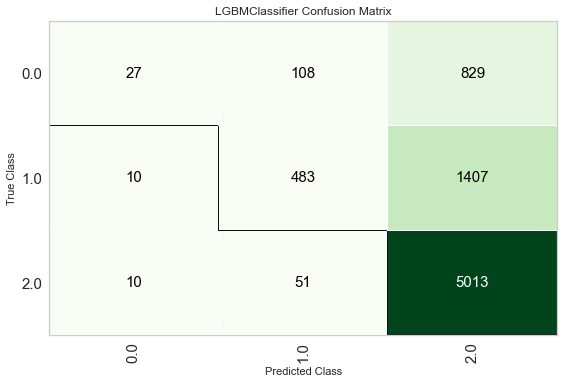

In [51]:
plot_model(lightgbm, plot = 'confusion_matrix')

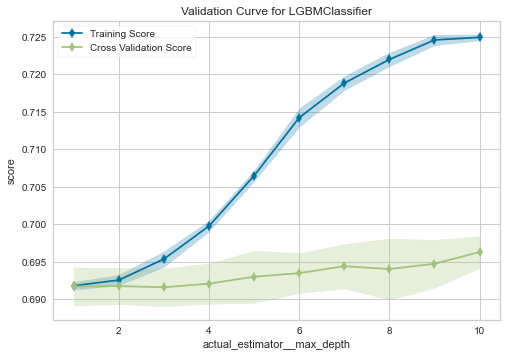

In [52]:
plot_model(lightgbm, plot = 'vc')

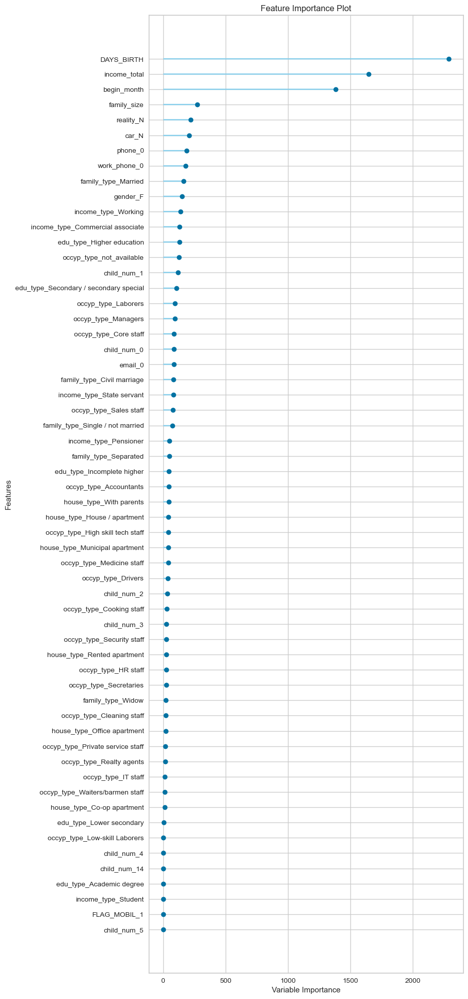

In [53]:
plot_model(lightgbm, plot = 'feature_all')

### 2-8. 앙상블 사용하기

blend models는 모델을 섞는 방법 중 하나입니다. voting에 가중 평균을 한다고 생각하면 됩니다.

In [54]:
blended = blend_models(estimator_list = best5, fold = 5, optimize = 'logloss')
pred_holdout = predict_model(blended)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
0,0.6963,0.6989,0.4182,0.6931,0.6150,0.2239,0.3142,0.7748
1,0.6890,0.6913,0.4095,0.6763,0.6051,0.2034,0.2883,0.7820
2,0.6984,0.7110,0.4214,0.7179,0.6181,0.2297,0.3216,0.7684
3,0.6971,0.7044,0.4174,0.6915,0.6147,0.2238,0.3180,0.7732
4,0.6959,0.7187,0.4213,0.6846,0.6176,0.2304,0.3113,0.7643
Mean,0.6953,0.7048,0.4176,0.6927,0.6141,0.2222,0.3107,0.7726
SD,0.0033,0.0095,0.0044,0.0139,0.0047,0.0098,0.0117,0.0060


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
0,Voting Classifier,0.6972,0.7142,0.4204,0.7067,0.6156,0.2300,0.3260,0.7714


이 중에서 괜찮은 모델만 가져와서 따로 진행할 수도 있습니다.

In [55]:
custom_model = compare_models(fold = 5, sort = 'logloss', n_select = 6, 
                              include=['lightgbm','gbc','rf','ada', 'lda', 'nb'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.6961,0.6911,0.4239,0.6828,0.6196,0.2325,0.3122,0.7735,0.3880
gbc,Gradient Boosting Classifier,0.6917,0.6436,0.4091,0.6578,0.6063,0.2082,0.2983,0.7980,1.7420
nb,Naive Bayes,0.6438,0.6055,0.3355,0.5814,0.5061,0.0068,0.0491,0.8648,0.0420
lda,Linear Discriminant Analysis,0.6431,0.6026,0.3369,0.5324,0.5093,0.0107,0.0452,0.8653,0.0860
rf,Random Forest Classifier,0.6983,0.7415,0.5317,0.6749,0.6798,0.3617,0.3692,0.9502,0.4360
ada,Ada Boost Classifier,0.6914,0.6191,0.4051,0.6225,0.6023,0.2005,0.2994,1.0784,0.1980


In [56]:
blended_custom = blend_models(estimator_list = custom_model, fold = 5, optimize = 'logloss')
pred_holdout_custom = predict_model(blended_custom)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
0,0.6949,0.7186,0.4121,0.7039,0.6096,0.2139,0.3108,0.7918
1,0.6909,0.7185,0.4061,0.6970,0.6027,0.1999,0.2975,0.7947
2,0.6960,0.7354,0.4130,0.7130,0.6107,0.2174,0.3145,0.7870
3,0.6957,0.7284,0.4107,0.6862,0.6087,0.2135,0.3150,0.7890
4,0.6973,0.7372,0.4158,0.7403,0.6136,0.2254,0.3173,0.7847
Mean,0.6950,0.7276,0.4115,0.7081,0.6091,0.2140,0.3110,0.7894
SD,0.0022,0.0080,0.0032,0.0183,0.0036,0.0083,0.0071,0.0035


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
0,Voting Classifier,0.6965,0.7389,0.4174,0.7335,0.6127,0.2243,0.3254,0.7861


In [57]:
blended_custom

VotingClassifier(estimators=[('lightgbm',
                              LGBMClassifier(boosting_type='gbdt',
                                             class_weight=None,
                                             colsample_bytree=1.0,
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=2223, reg_alpha=0.0,
                                             reg_lambda=0.0, silent=True,
                                             s...
                                                     min_s

In [58]:
#자동으로 상위 5개 선택한 모델
final_model = finalize_model(blended)
final_model_custom = finalize_model(blended_custom)

### 2-9. Predict Proba를 위한 추가 절차

In [59]:
prep_pipe = get_config("prep_pipe")

In [60]:
prep_pipe

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False, features_todrop=[],
                                      id_columns=['index'],
                                      ml_usecase='classification',
                                      numerical_features=[], target='credit',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluster_all', 'passthrough'),
                ('dummy', Dummify(target='credit')),
                ('fix_perfect', Remo

In [61]:
prep_pipe.steps.append(['trained_model', final_model_custom])

In [62]:
print(prep_pipe)

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False, features_todrop=[],
                                      id_columns=['index'],
                                      ml_usecase='classification',
                                      numerical_features=[], target='credit',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer...
                                                                      min_samples_split=2,
                                                                      min_weight_fraction_leaf=0.0,
                                                                      n_estimators=100,
        

In [63]:
pred = prep_pipe.predict_proba(test)
pred

array([[0.12200904, 0.19059019, 0.68740076],
       [0.22373923, 0.1862641 , 0.58999667],
       [0.13617055, 0.18996738, 0.67386207],
       ...,
       [0.10456181, 0.1476653 , 0.7477729 ],
       [0.22747997, 0.20907006, 0.56344997],
       [0.15574273, 0.27816717, 0.5660901 ]])

해당 결과를 제출해봅시다. (15분)

In [64]:
sample_submission = pd.read_csv(submission_path)

In [65]:
sample_submission.iloc[:, 1:] = pred

In [66]:
sample_submission.to_csv('pycaret_test.csv',index=False)

### 3. Optuna

### 3-1 매개변수 조정의 방법들

매개변수를 tuning하는 방법은 많습니다.

- 수동으로 매개변수 조정
    - 어렵다.
- 그리드 서치와 랜덤 서치
    - 너무 오래걸린다. 그리고 성능향상도 기대하기 어렵다.
    - 애매함
- 베이즈 최적화 
    - hyperopt
    - optuna
    - NNI
    - gpyopt, spearmint, scikitoptimize....

### 3-2. 매개변수 tuning 팁.

매개변수 tuning에서는 다음과 같은 사항을 결정해야 합니다.

1. 베이스라인이 될 매개변수
    - 가장 기본이 될 매개변수는 지정하고 해당 score를 확인하는 게 좋습니다.
2. 탐색 대상이 될 매개변수와 범위
    - 중요 매개변수와 일반 매개변수의 이해가 필요
3. 평가 시스템 
    - 교차 검증 + 랜덤 시드 변경 등으로 성능 체크
    
tuning에서는 다음 포인트를 주의해주세요.

- 각 알고리즘마다 핵심 매개변수와 서브 매개변수가 있습니다.
- 매개변수의 값에 따라 모델의 복잡도를 조정할 수 있습니다.
- 매개변수 범위의 상한/하한에서 결과가 좋다면 범위를 넓혀서 테스트할 수 있습니다.
- 난수 시드를 고정하여 실험을 진행합니다.
- 난수 시드를 바꿔가며 실험의 유효성을 검증합니다.

In [67]:
# !pip install optuna

In [68]:
from lightgbm import LGBMClassifier
import optuna
from optuna import Trial
from optuna.samplers import TPESampler
from sklearn.metrics import log_loss
from sklearn.model_selection import train_test_split

In [69]:
train = pd.read_csv(train_path) 
test = pd.read_csv(test_path)

train = train.drop(["index"], axis=1)
train.fillna("NAN", inplace=True)

test = test.drop(["index"], axis=1)
test.fillna("NAN", inplace=True)

In [70]:
train_ohe = pd.get_dummies(train)
test_ohe = pd.get_dummies(test)

In [71]:
X = train_ohe.drop(["credit"], axis=1)
y = train["credit"]
X_test = test_ohe.copy()

In [72]:
def objective(trial):
    params_lgb = {
        "random_state": 42,
        "verbosity": -1,
        "learning_rate": 0.05,
        "n_estimators": 10000,
        "objective": "multiclass",
        "metric": "multi_logloss",
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 3e-5),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 9e-2),
        "max_depth": trial.suggest_int("max_depth", 1, 20),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.4, 1.0),
        "subsample": trial.suggest_float("subsample", 0.3, 1.0),
        "subsample_freq": trial.suggest_int("subsample_freq", 1, 10),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
        "max_bin": trial.suggest_int("max_bin", 200, 500),
    }
    
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2)

    model = LGBMClassifier(**params_lgb)
    model.fit(
        X_train,
        y_train,
        eval_set=[(X_train, y_train), (X_valid, y_valid)],
        early_stopping_rounds=100,
        verbose=False,
    )

    lgb_pred = model.predict_proba(X_valid)
    log_score = log_loss(y_valid, lgb_pred)
    
    return log_score

In [73]:
sampler = TPESampler(seed=42)

study = optuna.create_study(
    study_name="lgbm_parameter_opt",
    direction="minimize",
    sampler=sampler,
)

study.optimize(objective, n_trials=10)

print("Best Score:", study.best_value)
print("Best trial:", study.best_trial.params)

[I 2021-09-12 20:15:49,121] A new study created in memory with name: lgbm_parameter_opt
[I 2021-09-12 20:15:56,370] Trial 0 finished with value: 0.7435415152443778 and parameters: {'reg_alpha': 1.12424581642324e-05, 'reg_lambda': 0.08556428806974939, 'max_depth': 15, 'num_leaves': 154, 'colsample_bytree': 0.4936111842654619, 'subsample': 0.40919616423534183, 'subsample_freq': 1, 'min_child_samples': 88, 'max_bin': 380}. Best is trial 0 with value: 0.7435415152443778.
[I 2021-09-12 20:16:03,234] Trial 1 finished with value: 0.7308179273055841 and parameters: {'reg_alpha': 2.1245096608103405e-05, 'reg_lambda': 0.0018526142807772773, 'max_depth': 20, 'num_leaves': 214, 'colsample_bytree': 0.5274034664069657, 'subsample': 0.42727747704497043, 'subsample_freq': 2, 'min_child_samples': 34, 'max_bin': 357}. Best is trial 1 with value: 0.7308179273055841.
[I 2021-09-12 20:16:10,992] Trial 2 finished with value: 0.7321131311102975 and parameters: {'reg_alpha': 1.2964031109077052e-05, 'reg_lambd

Best Score: 0.7269401983982571
Best trial: {'reg_alpha': 1.987904330777592e-05, 'reg_lambda': 0.028054003730936226, 'max_depth': 11, 'num_leaves': 141, 'colsample_bytree': 0.5109126733153162, 'subsample': 0.9787092394351908, 'subsample_freq': 8, 'min_child_samples': 95, 'max_bin': 469}


In [74]:
optuna.visualization.plot_optimization_history(study)

In [75]:
optuna.visualization.plot_parallel_coordinate(study)

In [76]:
optuna.visualization.plot_contour(
    study,
    params=[
        "max_depth",
#         "num_leaves",
#         "colsample_bytree",
        "subsample",
#         "subsample_freq",
        "min_child_samples",
#         "max_bin",
    ],
)

In [77]:
optuna.visualization.plot_param_importances(study)

- pycaret으로 benchmark 만들기
- 개별 모델 (lightgbm, xgboost, lr)
- feature engineering을 많이 진행
- feature importance, feature selection 등을 통해 개별 모델 성능을 올리기
- optuna 개별 모델 성능 쥐어짜내기
- 개별 모델 최적화 내용 앙상블 (blending, voting, stacking) => 대회에 제출
- 데이터에 대한 인사이트 + 테크닉(최신 모델 사용)~ => 금메달

## Auto EDA


In [78]:
# pip install pandas_profiling

In [79]:
from pandas_profiling import ProfileReport

In [80]:
profile = ProfileReport(train, title="Pandas Profiling Report")

In [81]:
profile

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Future Reading

https://github.com/tqdm/tqdm